In [1]:
import sys
try:
    sys.path.remove('/opt/ros/kinetic/lib/python2.7/dist-packages')
except:
    pass
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import shutil
import sys
import scipy
import random
import math
import skimage.io
import datetime
import open3d as o3d
import tensorflow as tf

# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
# Import COCO config
#sys.path.append(os.path.join(ROOT_DIR, "samples/balloon/"))  # To find local version
Stones_DIR = os.path.join(ROOT_DIR, "datasets/plastic_cards")

import coco

#from samples.blister import blister_mul_class
import plastic_card
%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
STONES_MODEL_PATH = "../../samples/plastic_card/mask_rcnn_plastic_card_0099.h5"

# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

# Directory of images to run detection on
IMAGE_DIR = os.path.join(ROOT_DIR, "images")
sys.path.append('/opt/ros/kinetic/lib/python2.7/dist-packages')
from scoop.msg import plastic_card_pose
import rospy
import geometry_msgs.msg
import time
import actionlib
from std_msgs.msg import String

Using TensorFlow backend.


In [2]:
rospy.init_node('stone_segmentation')

In [3]:
def make_directories():
    if not os.path.exists("JPEGImages/"):
        os.makedirs("JPEGImages/")
    if not os.path.exists("depth/"):
        os.makedirs("depth/")

In [4]:
# Start instance segmentation by Mask RCNN
class InferenceConfig(plastic_card.StonesConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
##config.display()
# Create model object in inference mode.
model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)
# Load weights trained on MS-COCO
model.load_weights(STONES_MODEL_PATH, by_name=True)
# Load dataset
# Get the dataset from the releases page
# https://github.com/matterport/Mask_RCNN/releases
dataset = plastic_card.StonesDataset()
dataset.load_stones(Stones_DIR, "train")
# Must call before using the dataset
dataset.prepare()
#print("Image Count: {}".format(len(dataset.image_ids)))
#print("Class Count: {}".format(dataset.num_classes))
class_names = dataset.class_names






Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.







In [5]:
def pixel_to_camera(pixel, intrin, depth):
    #depth = depth #/ 1000
    X = (pixel[0]-intrin[0]) * depth / intrin[2]
    Y = (pixel[1]-intrin[1]) * depth / intrin[3]
    return [X, Y]

In [6]:
# Compute position of mask center and rotation of mask
def get_mask_pose(depth_intrin, depth_array, m_c, mm_pair, max_d, min_d, surf_normal):
    #position = m_c
    #print('select mask center', m_c)
    m_c_dist = depth_array[m_c[1], m_c[0]]/1000
    if m_c_dist==0:
        center_z_set = []
        for i in range(-10,10):
            for j in range(-10,10):
                if depth_array[m_c[1]+i,m_c[0]+j]/1000 != 0:
                    center_z_set.append(depth_array[m_c[1]+i,m_c[0]+j]/1000)
        if center_z_set != []:
            m_c_dist=np.mean(center_z_set)  
        else:
            m_c_dist=0
    #position = rs.rs2_deproject_pixel_to_point(depth_intrin, m_c, m_c_dist)
    position = pixel_to_camera(m_c, depth_intrin, m_c_dist)
    min2max_vec = [mm_pair[0][0]-mm_pair[1][0], mm_pair[0][1]-mm_pair[1][1]]
    yaw = math.atan2(min2max_vec[1], min2max_vec[0])
    #print('test min2max_vec and yaw', min2max_vec, yaw)
    pitch = math.atan2(max_d-min_d, 0.023)
    if min2max_vec[0] > 0:
        yaw = math.pi/2 + yaw
    elif min2max_vec[0] < 0:
        if min2max_vec[1] > 0:
            yaw = -(3*math.pi/2-yaw)
        elif min2max_vec[1] < 0:
            yaw = -(-yaw-math.pi/2)
    if surf_normal == []:
        #print("surf normal empty")
        pose={
            'x':position[0],
            'y':position[1],
            'z':m_c_dist,
            'yaw':yaw,
            'pitch':pitch,
            'normal':surf_normal
        }
    else:
        pose={
            'x':position[0],
            'y':position[1],
            'z':m_c_dist,
            'yaw':yaw,
            'pitch':pitch,
            'normal':surf_normal
        }
    return pose

In [7]:
import time 

def generate_stone_pose(depth_image, depth_array, seg_result):
    depth_copy = depth_image.copy()     
    mask_store = 4
    mask_size = []
    mask_sequence_hori = []
    mask_center = []
    max_min_pair = []
    dist_min = []
    dist_max = []
    depth_set = []
    count_h = 0
    count_v = 0
    points = []
    point_show = []
    points_ero = []
    point_show_ero = []
    kernel = np.ones((15,15),np.uint8)
    center_position_set = []
    hori_box_set = []
    
    image_center = [depth_copy.shape[1]/2, depth_copy.shape[0]/2]
    for m in range(seg_result['masks'].shape[2]):
        if seg_result['scores'][m]<0.97:
            continue
        mask = seg_result['masks'][:,:,m]
        mask = mask.astype(np.uint8)
        edges = cv2.Canny(mask,0,1)
        if True:
            distance = []
            edge_point = []
            min_candidate = []
            max_candidate = []
            count = 0
            dist_max_ = -100000
            max_index = [0, 0]
            dist_min_ = 100000
            min_index = [0, 0]
            depth_intrin = [321.8862609863281, 238.18316650390625, 612.0938720703125, 611.785888671875]
            #print(depth_intrin)
            overall_mask_x = []
            overall_mask_y = []
            point = [] # store pointcloud of each go stone
            point_ero = [] # store pointcloud of each eroded go stone
            edge_pixel_set = np.argwhere(edges == 255)
            edge_pixel_set_copy=edge_pixel_set.tolist()
            edge_pixel_set_copy2=edge_pixel_set.tolist()
            for i in range(len(edge_pixel_set_copy2)):
                if edge_pixel_set_copy2[i][0]>=depth_copy.shape[0] or edge_pixel_set_copy2[i][1]>=depth_copy.shape[1]:
                    edge_pixel_set_copy.remove(edge_pixel_set_copy2[i])
            edge_pixel_set=np.array(edge_pixel_set_copy)
            overall_mask_x = edge_pixel_set[:,1].tolist()
            overall_mask_y = edge_pixel_set[:,0].tolist()
            for index in edge_pixel_set:
                depth_copy[index[0],index[1]] = [0, 255, 0]
            edge_point = edge_pixel_set[:]
            edge_point[:, [0, 1]] = edge_point[:, [1, 0]]
            edge_point = edge_point.tolist()
            for edge_pixel in edge_pixel_set_copy:
                if depth_array[edge_pixel[0],edge_pixel[1]]/1000 > dist_max_ and depth_array[edge_pixel[0],edge_pixel[1]]/1000 != 0:
                    dist_max_ = depth_array[edge_pixel[0],edge_pixel[1]]/1000
                    max_index = [edge_pixel[1], edge_pixel[0]] 
                if depth_array[edge_pixel[0],edge_pixel[1]]/1000 < dist_min_ and depth_array[edge_pixel[0],edge_pixel[1]]/1000 != 0:
                    dist_min_ = depth_array[edge_pixel[0],edge_pixel[1]]/1000
                    min_index = [edge_pixel[1], edge_pixel[0]] 
            pixel_radius=max(math.sqrt((max_index[0]-np.mean(overall_mask_x))**2+(max_index[1]-np.mean(overall_mask_y))**2),math.sqrt((min_index[0]-np.mean(overall_mask_x))**2+(min_index[1]-np.mean(overall_mask_y))**2))        
            distance = math.sqrt((np.mean(overall_mask_x)-image_center[0])**2+(np.mean(overall_mask_y)-image_center[1])**2)
            distance_coefficient = max(min(1,-0.25*distance+3*0.25*pixel_radius+1),0)
            mask_eff_area=np.sum(mask)*distance_coefficient
            erosion = cv2.erode(mask,kernel,iterations = 3)
            mask_pixel_set = np.argwhere(mask == 1)
            mask_pixel_set_copy=mask_pixel_set.tolist()
            for i in mask_pixel_set:
                if i[0]>=depth_copy.shape[0] or i[1]>=depth_copy.shape[1]:
                    mask_pixel_set_copy.remove(i.tolist())
            for mask_pixel in mask_pixel_set_copy:
                i = mask_pixel[0]
                j = mask_pixel[1]
                xy = pixel_to_camera([j, i], depth_intrin, depth_array[i, j])
                point.append([xy[0], xy[1], depth_array[i, j]]) # add pointcloud
            erosion_pixel_set = np.argwhere(erosion == 1)
            erosion_pixel_set_copy=erosion_pixel_set.tolist()
            for i in erosion_pixel_set:
                if i[0]>=depth_copy.shape[0] or i[1]>=depth_copy.shape[1]:
                    erosion_pixel_set_copy.remove(i.tolist())
            for erosion_pixel in erosion_pixel_set_copy:
                i = erosion_pixel[0]
                j = erosion_pixel[1]
                xy = pixel_to_camera([j, i], depth_intrin, depth_array[i, j])
                point_ero.append([xy[0], xy[1], depth_array[i, j]]) # add pointcloud
            point_show = point_show + point # pointcloud for all go stone candidates
            points.append(point)
            point_show_ero = point_show_ero + point_ero # pointcloud for all eroded go stone candidates
            points_ero.append(point_ero)
        
            #print('another dist max min', dist_max_, dist_min_)
            cv2.circle(depth_copy,tuple(edge_point[0]), 5, (0,0,255), 2)
            max_min_pair.append([max_index, min_index])
            dist_max.append(dist_max_)
            dist_min.append(dist_min_)
            mask_center.append([int(round(np.mean(overall_mask_x))), int(round(np.mean(overall_mask_y))), count_h])
            cv2.circle(depth_copy,tuple(max_min_pair[count_h][0]), 5, (0,0,0), 2)
            cv2.circle(depth_copy,tuple(max_min_pair[count_h][1]), 5, (255,0,0), 2)
            cv2.circle(depth_copy,tuple(mask_center[count_h][:2]), 5, (255,0,0), 1)
            mask_size.append(mask_eff_area)
            contours,_ = cv2.findContours(mask.copy(), 1, 2)
            cnt = contours[0]     
            for j in range(len(contours)):
                if(len(contours[j]) > len(cnt)):
                    cnt = contours[j]
            for index in cnt:
                depth_copy[index[0][1],index[0][0]] = [0, 0, 255] 
            hull = cv2.convexHull(cnt,returnPoints = True)
            rect = cv2.minAreaRect(hull)
            box = cv2.boxPoints(rect)
            box = np.int0(box)
            cv2.drawContours(depth_copy, [box], 0, (0, 255, 0), 1)
            center_pixel = [np.mean(np.array(cnt)[:,0,1]), np.mean(np.array(cnt)[:,0,0])]
            center_z_set = []
            for i in range(-3,4):
                for j in range(-3,4):
                    if depth_array[round(center_pixel[0])+i,round(center_pixel[1])+j]/1000 != 0:
                        center_z_set.append(depth_array[round(center_pixel[0])+i,round(center_pixel[1])+j]/1000)
            
            center_z=np.mean(center_z_set)
            if center_z == 0:
                continue
            box_real = []
            for i in range(len(box)):
                box_real.append(pixel_to_camera([box[i][0], box[i][1]], depth_intrin, center_z))
            center_x = np.mean(np.array(box_real)[:,0])
            center_y = np.mean(np.array(box_real)[:,1])
            
            distance = math.sqrt((center_pixel[0]-image_center[0])**2+(center_pixel[1]-image_center[1])**2)
            center_position_set.append([center_x, center_y, center_z])
            distance_coefficient = max(min(2,0.02*distance-2),1)
            hori_box_set.append(box_real)
            mask_sequence_hori.append(mask)
            count_h = count_h + 1
            
    hori_mask_index = np.argsort(-np.array(mask_size))[0:mask_store]
    
    plt.figure()
    plt.rcParams['figure.figsize'] = [24, 12]
    plt.imshow(depth_copy)
    
    surf_normal_set = dict()
    # Generate surface normal
    for k in hori_mask_index:
        pcd_ero = o3d.geometry.PointCloud()
        pcd_ero.points = o3d.utility.Vector3dVector(points_ero[mask_center[k][2]])
        pcd_temp = o3d.geometry.PointCloud()
        pcd_temp.points = o3d.utility.Vector3dVector(point_show_ero)
        o3d.io.write_point_cloud("test_ros_ero.ply", pcd_temp)
        o3d.io.write_point_cloud("test_ros_ero_selected.ply", pcd_ero)
        downpcd = o3d.geometry.voxel_down_sample(pcd_ero, voxel_size=1)
        #print("Recompute the normal of the downsampled point cloud")
        o3d.geometry.estimate_normals(downpcd, search_param=o3d.geometry.KDTreeSearchParamHybrid(
            radius=10, max_nn=30))
        #print("Normal as a numpy array")
    
        for i in range(np.asarray(downpcd.normals).shape[0]):
            if downpcd.normals[i][2] > 0:
                downpcd.normals[i][0] = -downpcd.normals[i][0]
                downpcd.normals[i][1] = -downpcd.normals[i][1]
                downpcd.normals[i][2] = -downpcd.normals[i][2]
    
        normals = np.asarray(downpcd.normals)
        surf_normal_set[k]=np.sum(normals, axis=0) / normals.shape[0]
    
    return [[get_mask_pose(depth_intrin, depth_array, mask_center[k], max_min_pair[mask_center[k][2]], dist_max[mask_center[k][2]], dist_min[mask_center[k][2]], surf_normal_set[k]), depth_copy, hori_box_set[k], mask_sequence_hori[k]] for k in hori_mask_index]

In [8]:
is_detect = 0
img_index = 0
def img_index_callback(data):
    global img_index
    global is_detect
    
    #print(data.data)
    img_index = data.data
    is_detect = 1

In [9]:

rospy.Subscriber('/stone_img_index', String, img_index_callback)

In [10]:
#import time
#is_detect = 1

Processing 1 images
image                    shape: (480, 640, 3)         min:    4.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


/home/terry/anaconda3/envs/tensorflow_GPU/lib/python3.6/site-packages/ipykernel_launcher.py:29: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


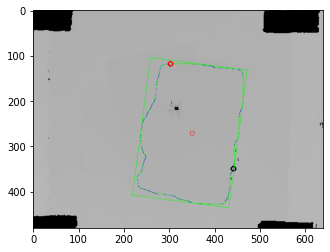

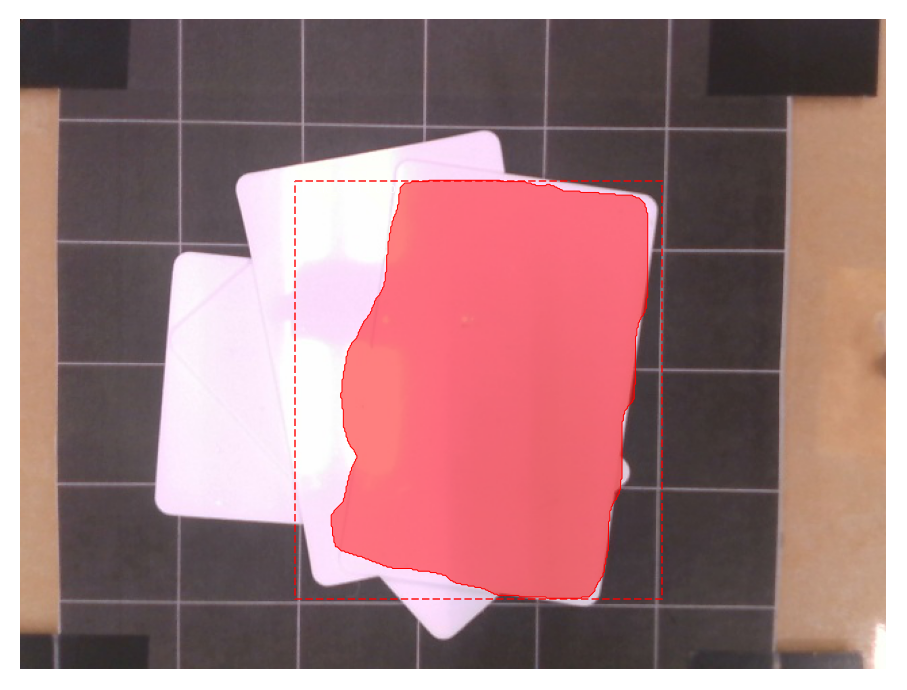

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 1
x: 0.008276166156090824
y: 0.009333541577293361
z: 0.174
yaw: 2.5999008893746183
pitch: 0.334736837316815
normal: [ 0.00816476  0.03197892 -0.91743009]
box: "[[0.03130204607926213, 0.05597731111887064], [-0.029247490015003166, 0.04801374070933306],\
  \ [-0.017876685114671654, -0.0381634676510201], [0.04267285097959364, -0.030199897241482507]]"
Processing 1 images
image                    shape: (480, 640, 3)         min:    2.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


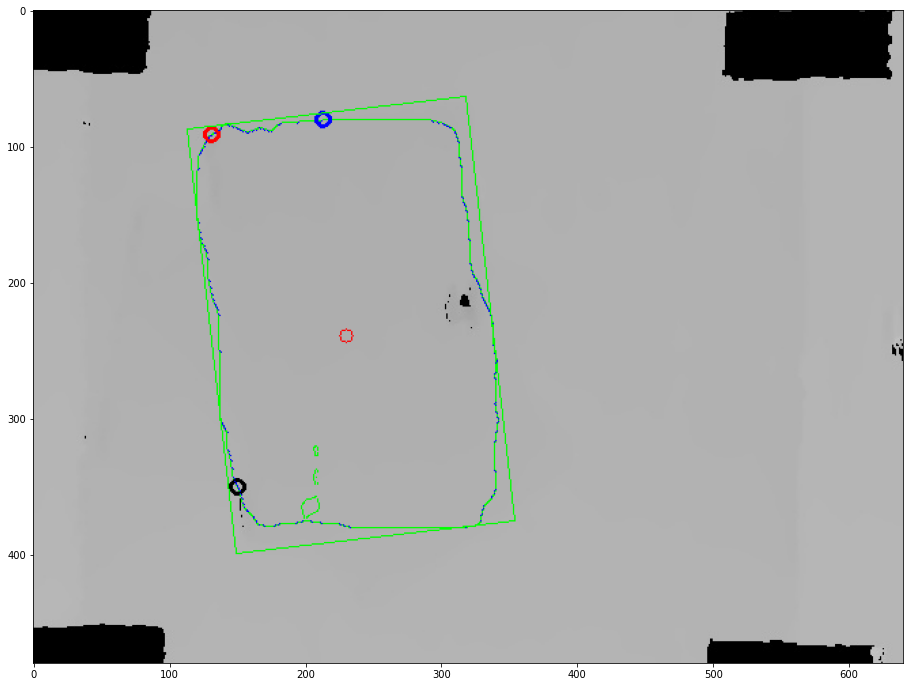

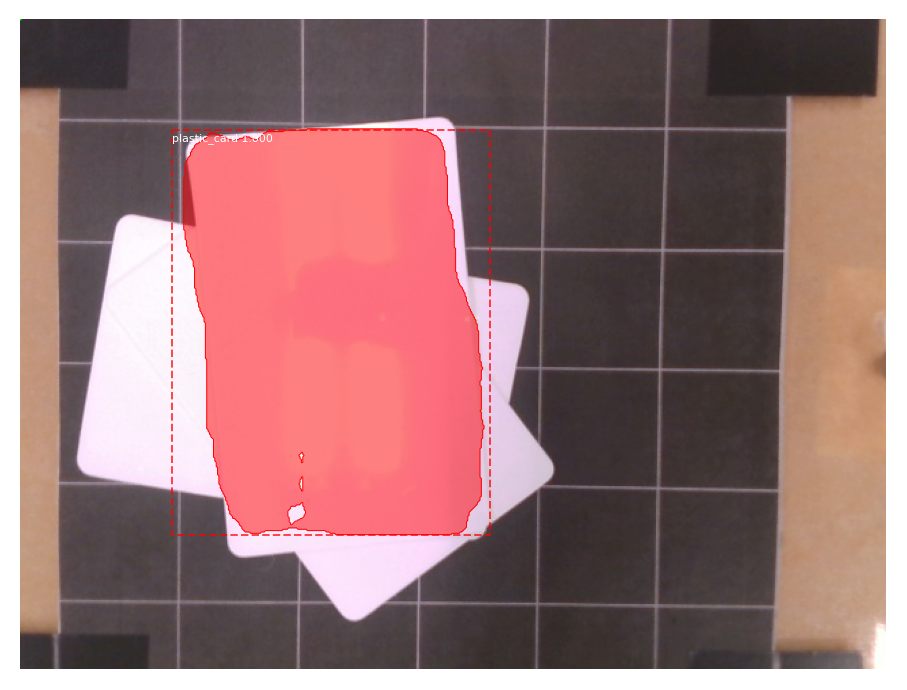

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 1
x: -0.026120518667412003
y: 0.00023231825210754723
z: 0.174
yaw: 3.0683647522079363
pitch: 0.29544083714371916
normal: [ 0.00100544  0.04943395 -0.94271362]
box: "[[-0.049146398590583305, 0.0457384348780366], [-0.05938012300088166, -0.04299849254252506],\
  \ [-0.0011047478866826753, -0.04982441003641441], [0.009128976523615684, 0.03891251738414724]]"
Processing 1 images
image                    shape: (480, 640, 3)         min:   23.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


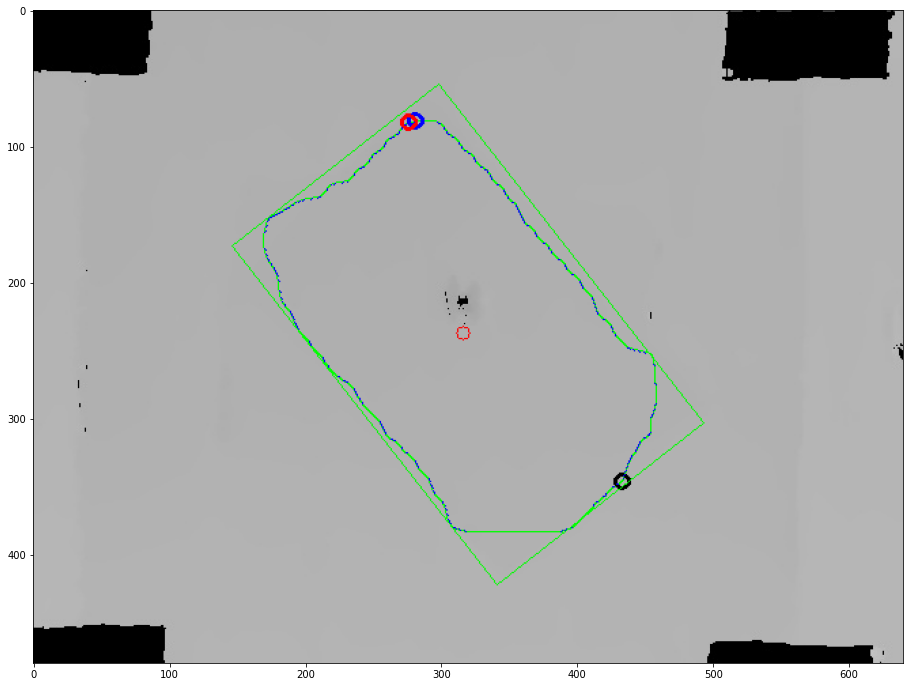

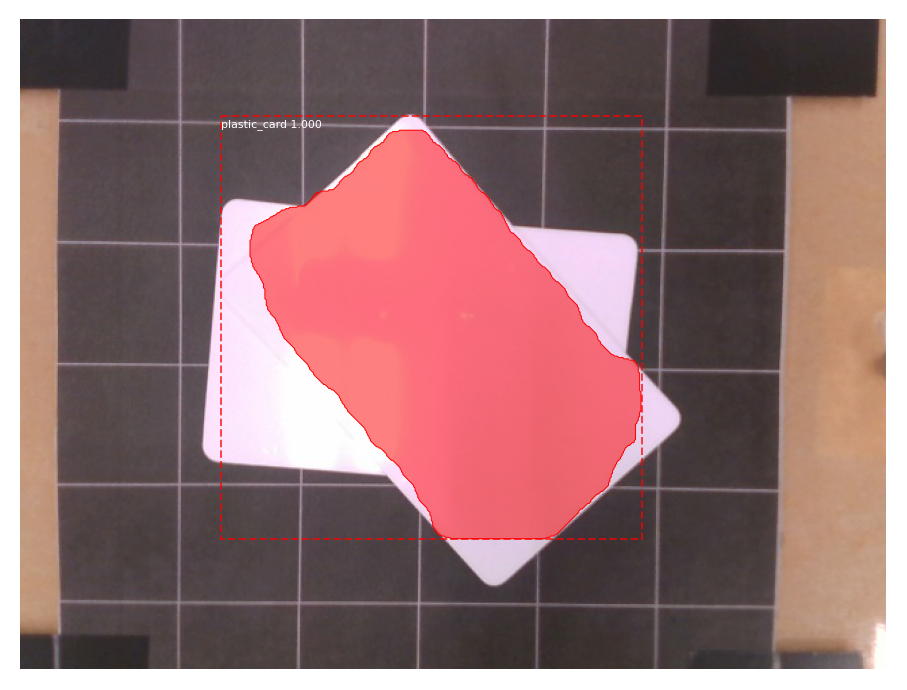

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 1
x: -0.0016829047301572927
y: -0.0003384421609218337
z: 0.175
yaw: 2.6050815644619876
pitch: 0.21406068356382169
normal: [ 0.01764513  0.03994062 -0.90077345]
box: "[[0.005277330881266338, 0.05077764204120317], [-0.04856245008000163, -0.018006226268269566],\
  \ [-0.006595031074295318, -0.05087883803062803], [0.04724474988697265, 0.017905030278844717]]"
Processing 1 images
image                    shape: (480, 640, 3)         min:   25.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


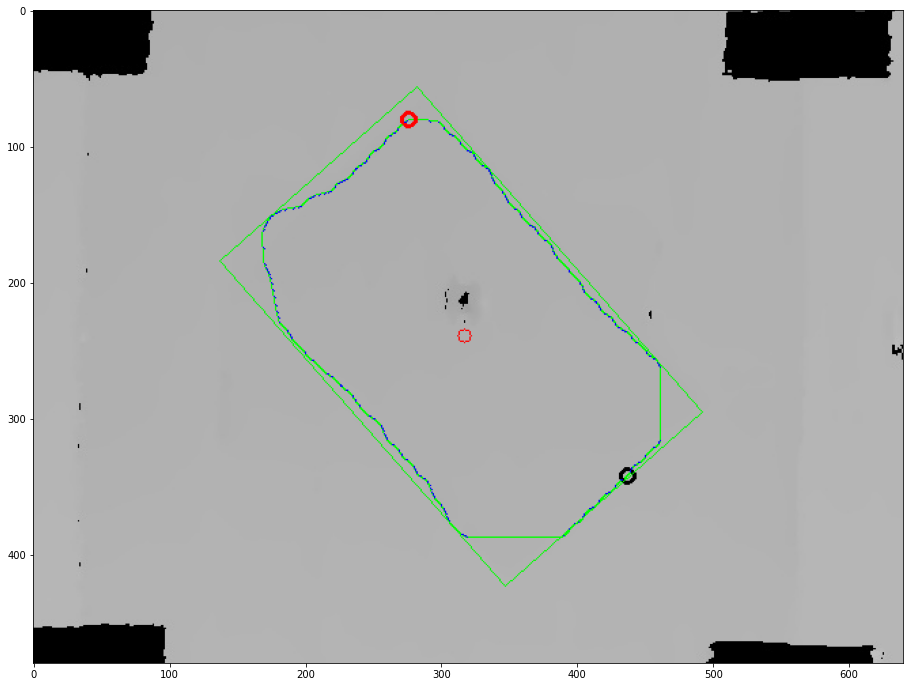

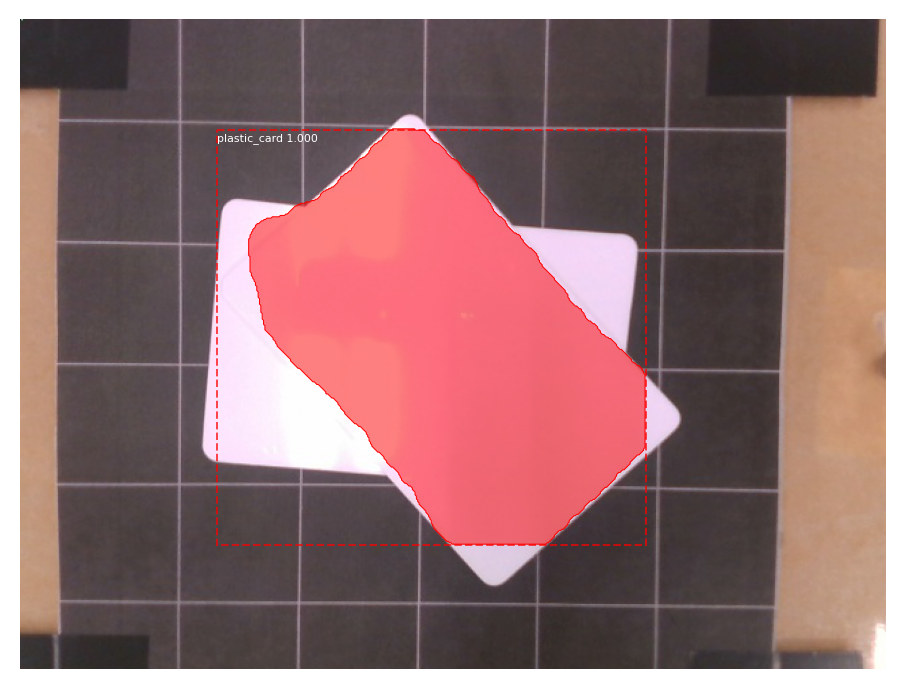

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 1
x: -0.0013970008713127505
y: 0.0002336534144759814
z: 0.175
yaw: 2.590576784736477
pitch: 0.21406068356382169
normal: [ 0.01116855  0.04329082 -0.90587778]
box: "[[0.007030232612270726, 0.05176287854969393], [-0.051756268584270765, -0.015175439456053784],\
  \ [-0.011165589186658784, -0.0510252499361195], [0.04762091200988271, 0.01591306806962821]]"
Processing 1 images
image                    shape: (480, 640, 3)         min:   16.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


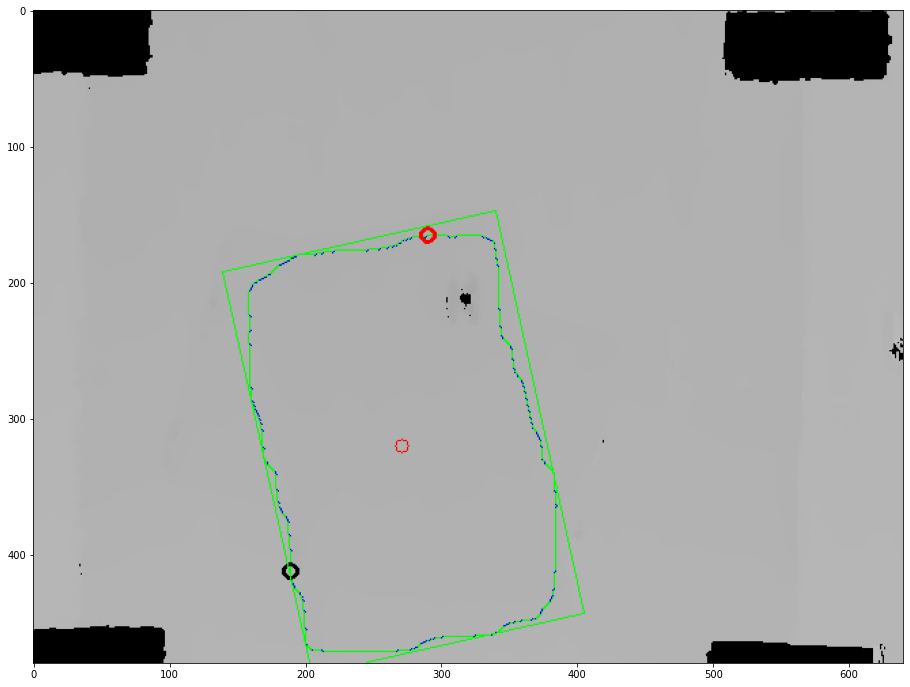

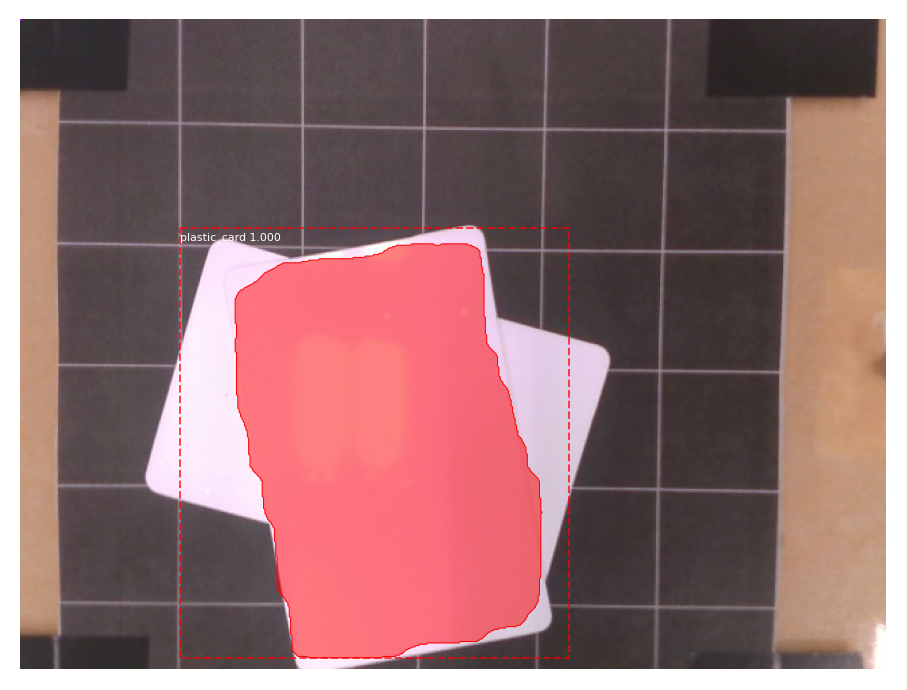

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 1
x: -0.014631713111751194
y: 0.02353725864219085
z: 0.176
yaw: -2.7534315895229104
pitch: 0.21406068356382169
normal: [-0.0111173   0.05168724 -0.94175914]
box: "[[-0.03360919439368379, 0.07186789285179826], [-0.05258667567561637, -0.01328608170798623],\
  \ [0.0052083809557237895, -0.02623178729984536], [0.023898324642475585, 0.058922187259939134]]"
Processing 1 images
image                    shape: (480, 640, 3)         min:   33.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


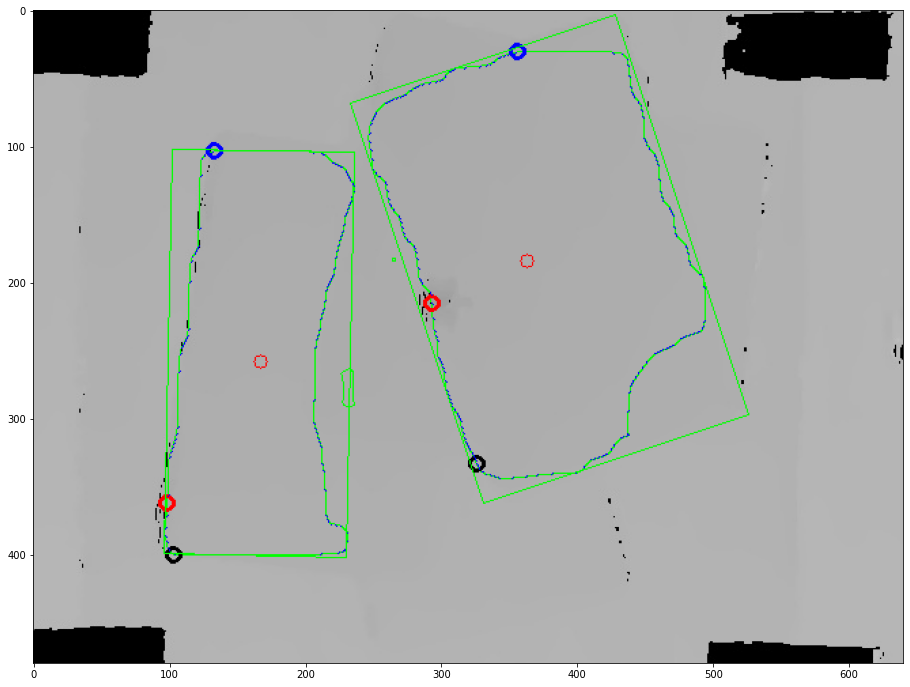

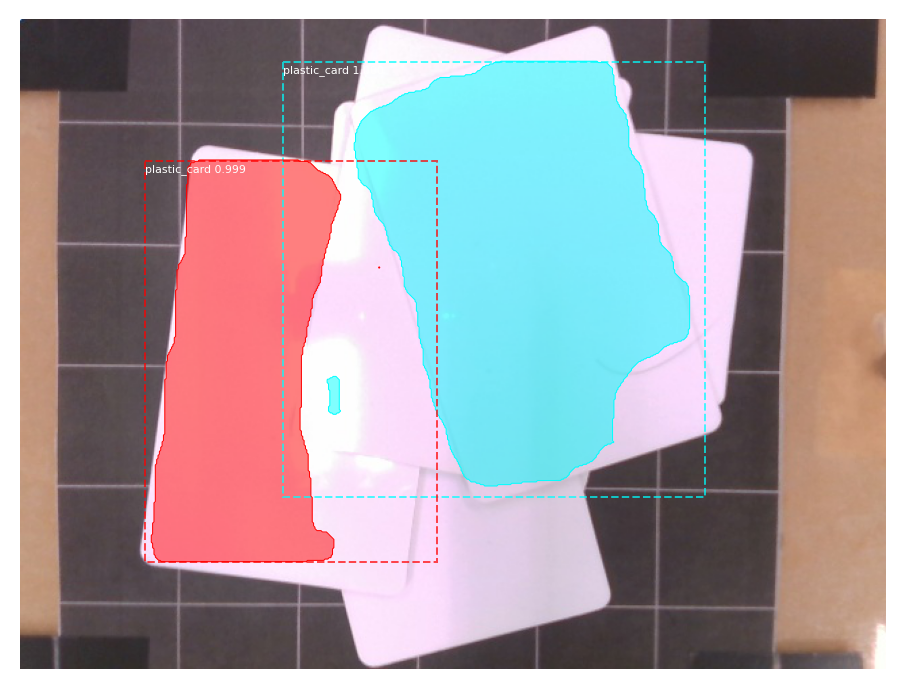

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 2
x: 0.011553069607498434
y: -0.015233278196238839
z: 0.172
yaw: 2.868898317044126
pitch: 0.6365082157879507
normal: [ 0.0614287   0.03626313 -0.96446792]
box: "[[0.0025609848127535135, 0.03481037362198833], [-0.024977274871152803, -0.047845995111487995],\
  \ [0.029818241846824054, -0.06612036234848107], [0.05735650153073037, 0.01653600638499526]]"
hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 2
x: -0.04377649307287417
y: 0.005603777822118022
z: 0.173
yaw: 3.010765257515736
pitch: 0.4101273405414903
normal: [ 0.01219225  0.05213562 -0.95333669]
box: "[[-0.025970400744036077, 0.046323906320147656], [-0.06384367649108853, 0.045475570309772034],\
  \ [-0.062147858174056346, -0.038509694717414084], [-0.024274582427003876, -0.03794413737716367]]"
Processing 1 images
image                    shape: (480, 6

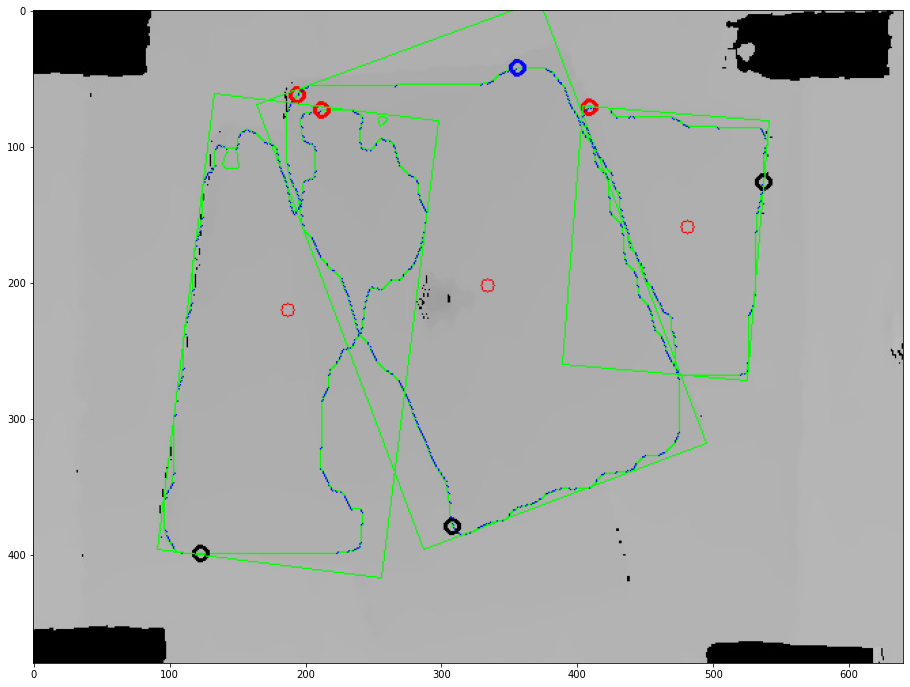

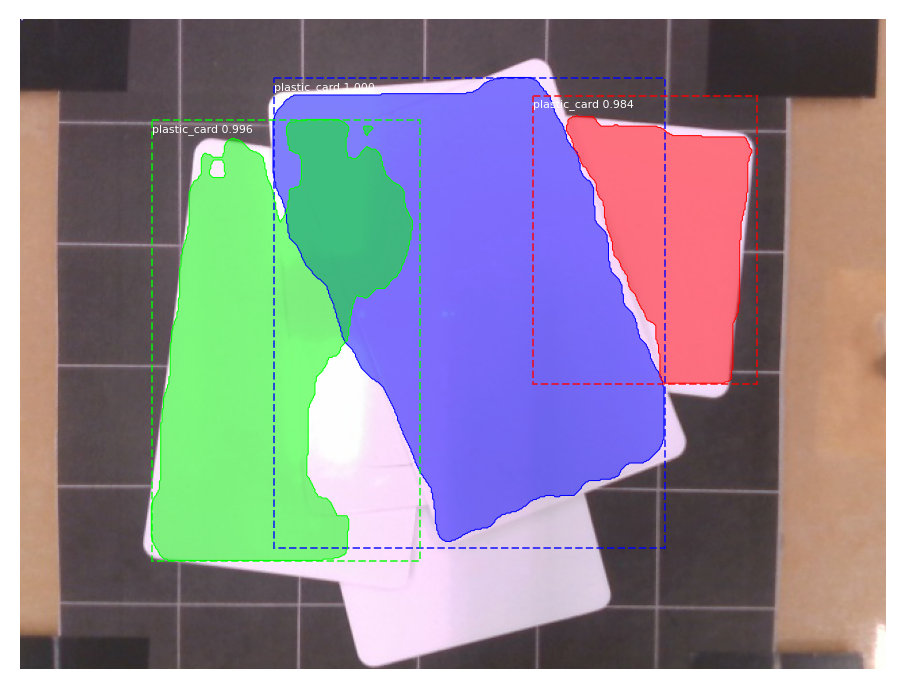

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 3
x: 0.00340399276226085
y: -0.010172684192148451
z: 0.172
yaw: 2.7963722310784274
pitch: 0.33473683731681386
normal: [ 0.03942753  0.04057639 -0.91729405]
box: "[[-0.009803131780020753, 0.04436927340749239], [-0.04436645770982154, -0.04756485100014965],\
  \ [0.014363096105856224, -0.06921294757320297], [0.04864541938582123, 0.02244003272310071]]"
hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 3
x: -0.03812376534943351
y: -0.005141811642639796
z: 0.173
yaw: -2.875081066422375
pitch: 0.3729877218000603
normal: [-0.0057369   0.06174815 -0.95457324]
box: "[[-0.018514213924929895, 0.05027329974559784], [-0.0648796511478334, 0.04436927340749239],\
  \ [-0.05307753985473068, -0.04981400389085648], [-0.006712102631827185, -0.04419112166408939]]"
hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0

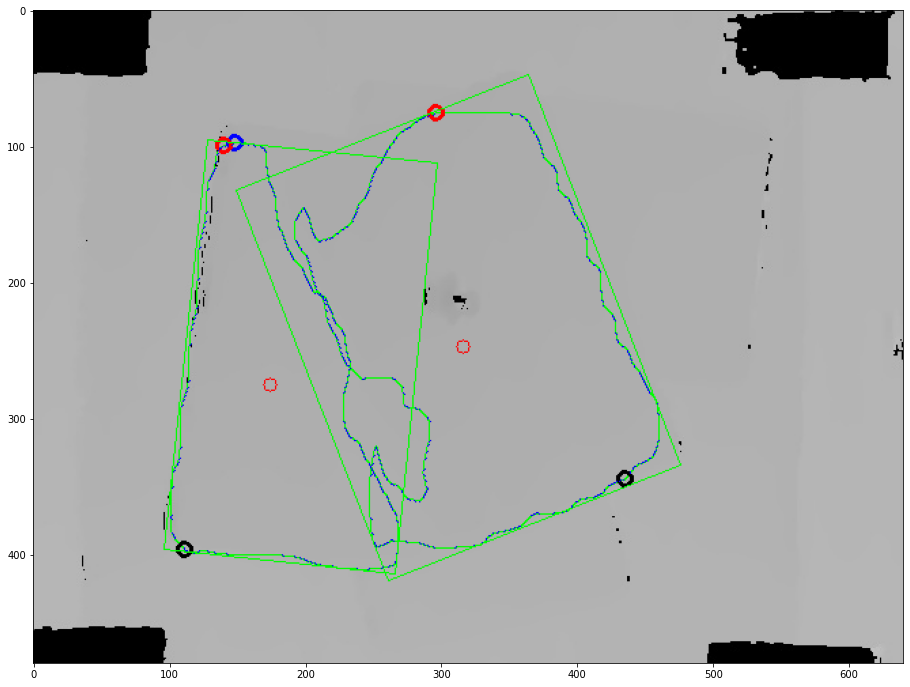

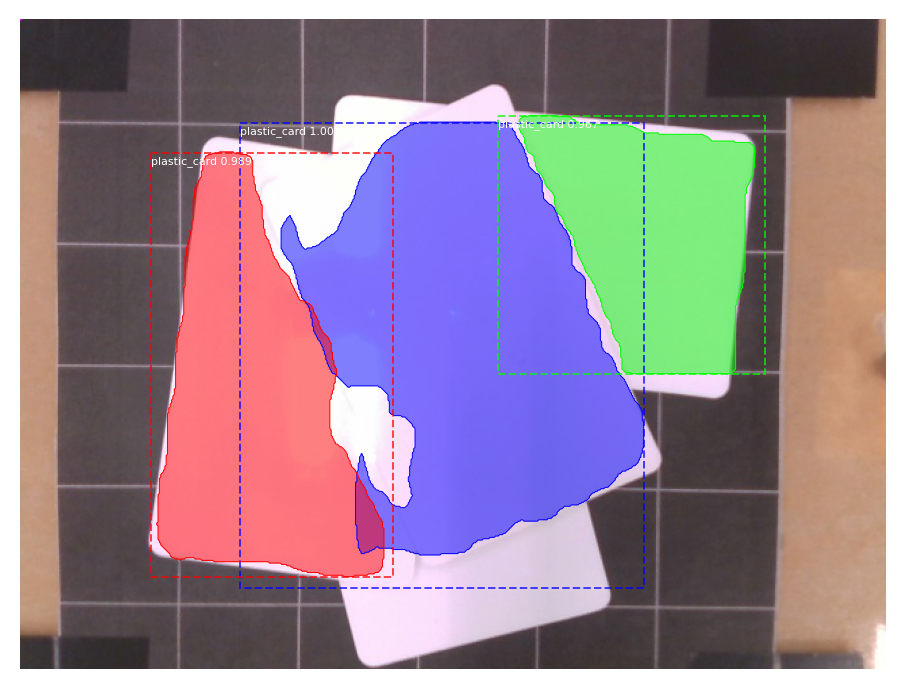

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 2
x: -0.0016636715332412097
y: 0.002493212450740759
z: 0.173
yaw: 2.6646518837774926
pitch: 0.21406068356382055
normal: [ 0.02541645  0.03930908 -0.9047994 ]
box: "[[-0.01720867277270304, 0.05113114371227615], [-0.04886394802397078, -0.030026334613657907],\
  \ [0.01190287500301639, -0.0540625215743004], [0.043558150254284125, 0.02709495675163366]]"
hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 2
x: -0.042039645527876125
y: 0.010471194492941586
z: 0.174
yaw: -3.0442581082302964
pitch: 0.4101273405414903
normal: [-0.00354237  0.0571291  -0.94228974]
box: "[[-0.01585884423203075, 0.04991665893924786], [-0.06409974408583867, 0.044806227571329814],\
  \ [-0.055019104113357184, -0.04065154141441082], [-0.0070619742586893065, -0.035825022900266]]"
Processing 1 images
image                    shape: (480, 64

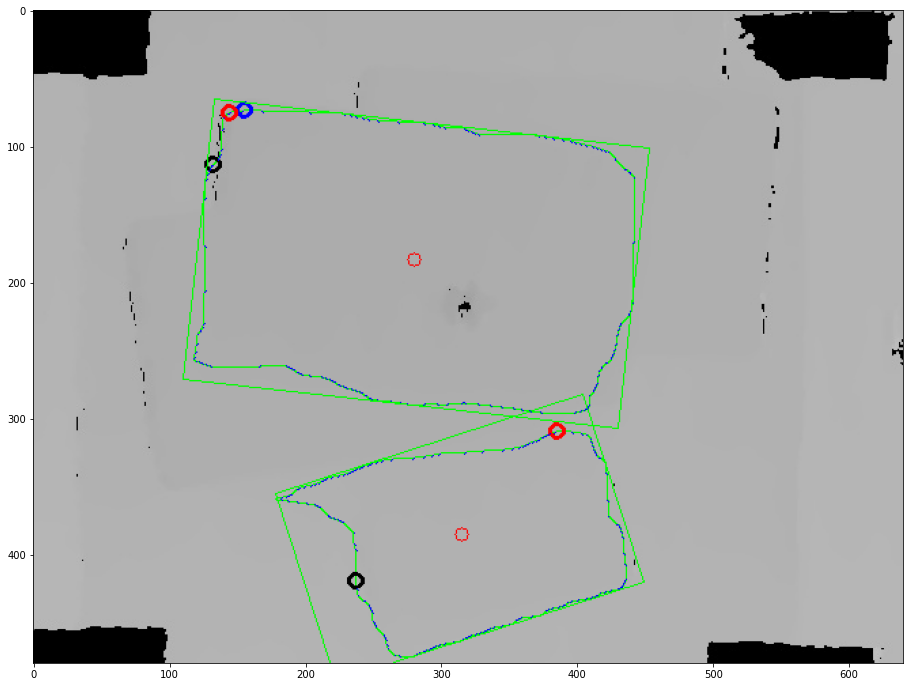

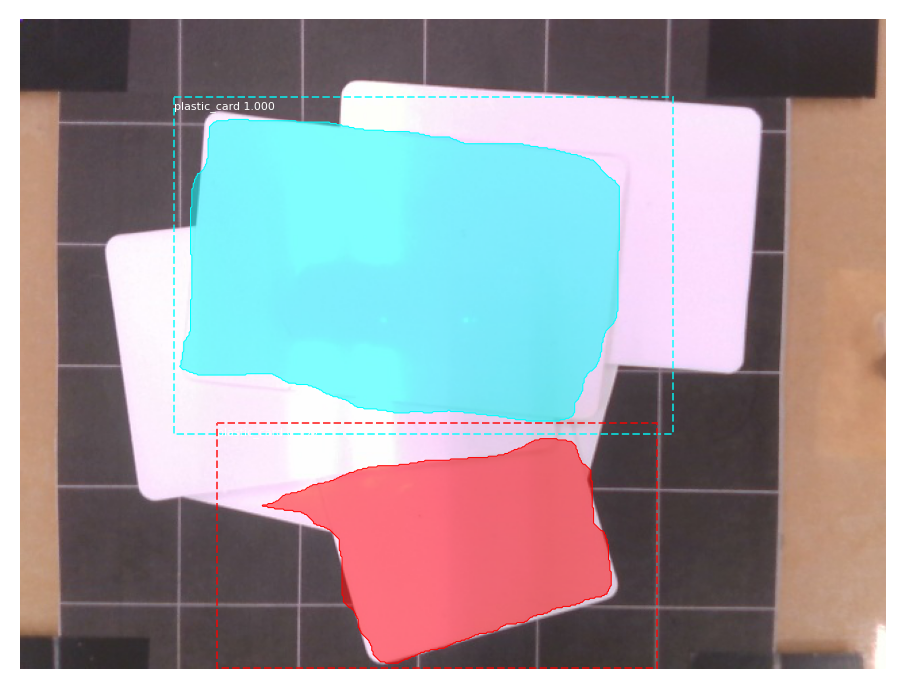

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 2
x: -0.011770150328871203
y: -0.015514422307577191
z: 0.172
yaw: -2.835713782184941
pitch: 0.29544083714371916
normal: [ 0.01617783  0.02795231 -0.91568456]
box: "[[0.03038024714649561, 0.019347447498378807], [-0.059540600800953594, 0.009226259490198034],\
  \ [-0.05307753985473068, -0.048689427445503065], [0.036843308092718526, -0.03856823943732229]]"
hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 2
x: -0.001991309258590428
y: 0.04247659190901382
z: 0.177
yaw: -2.209959068012558
pitch: 0.1721908145229392
normal: [ 0.00989094  0.04169217 -0.96713946]
box: "[[-0.028884243089676208, 0.07372281767845562], [-0.041607781676426474, 0.03379708475083553],\
  \ [0.02374493924642715, 0.012676950665935051], [0.03675764916469446, 0.05260268359355514]]"
Processing 1 images
image                    shape: (480, 640

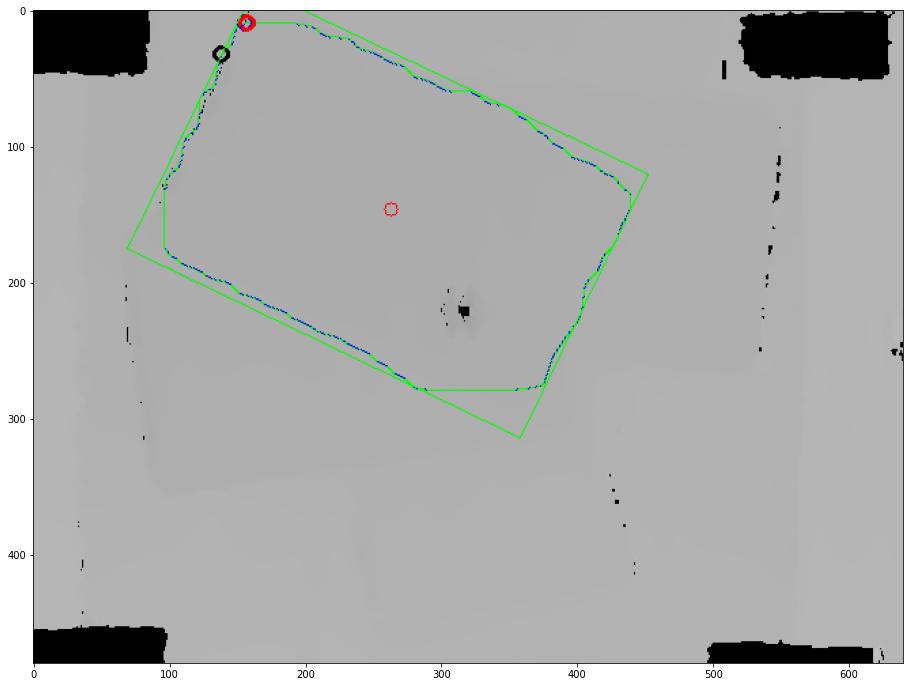

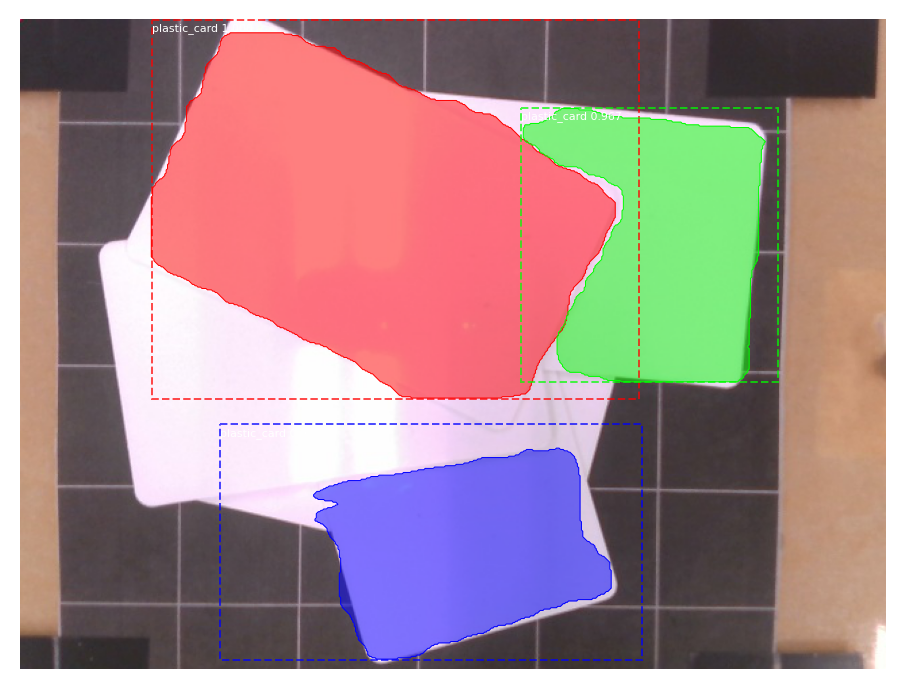

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 1
x: -0.016547195376079443
y: -0.025916754427096324
z: 0.172
yaw: -2.451146196535101
pitch: 0.21406068356382055
normal: [ 0.01886115  0.02764861 -0.91266155]
box: "[[0.01014805635831954, 0.021315456277747294], [-0.07106170944422052, -0.017763575198284032],\
  \ [-0.044928463009493096, -0.07202438868658652], [0.03656230544288275, -0.033226501321893545]]"
Processing 1 images
image                    shape: (480, 640, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


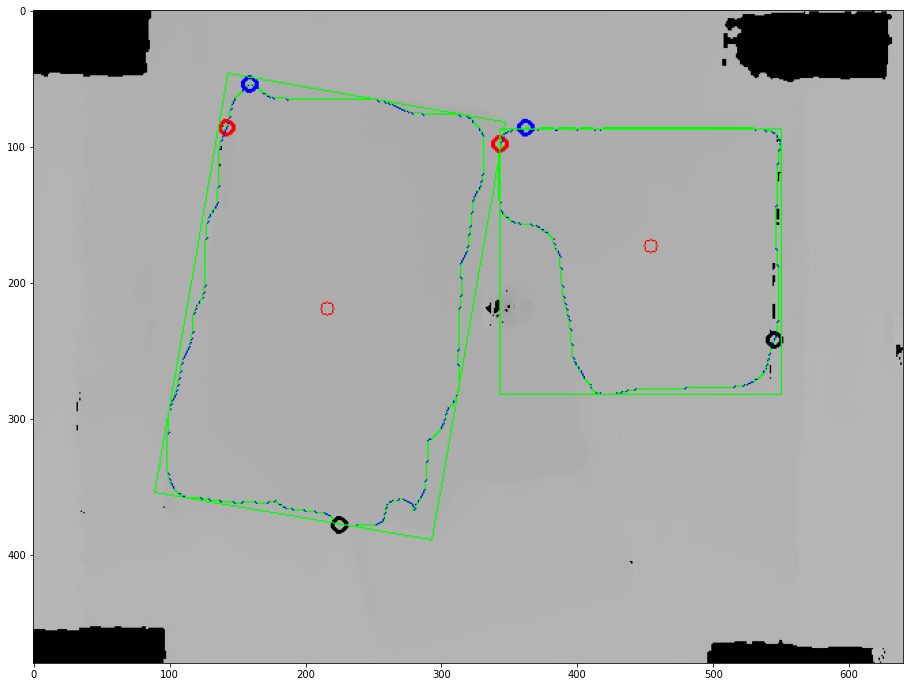

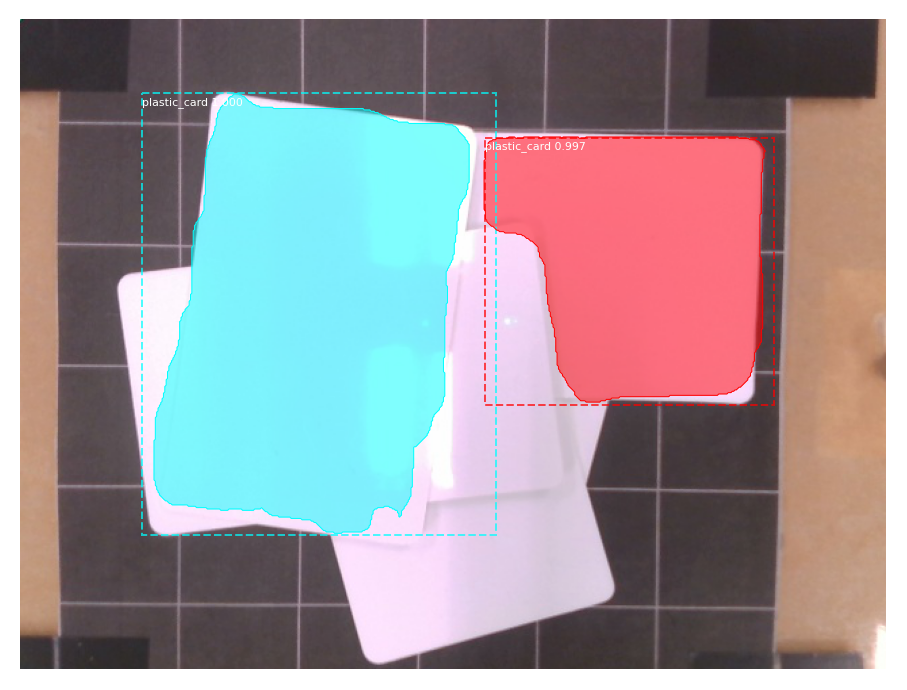

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 2
x: -0.02992731015044454
y: -0.005424590312765001
z: 0.173
yaw: 2.864650459814224
pitch: 0.33473683731681386
normal: [-0.05233091  0.0312721  -0.95796826]
box: "[[-0.008164308415197975, 0.04264778360851998], [-0.06582213119429278, 0.03275053015413778],\
  \ [-0.05055976634100298, -0.05434530024442561], [0.007098056438091823, -0.0441652681199182]]"
hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 2
x: 0.037771827790389546
y: -0.018645500573651917
z: 0.175
yaw: 2.1901086059293444
pitch: 0.29544083714372027
normal: [ 0.01873367  0.02107495 -0.93641119]
box: "[[0.06521859823946563, 0.012533708285529008], [0.006036499458645352, 0.012533708285529008],\
  \ [0.006036499458645352, -0.04324561031575797], [0.06521859823946563, -0.04324561031575797]]"
Processing 1 images
image                    shape: (480, 640, 

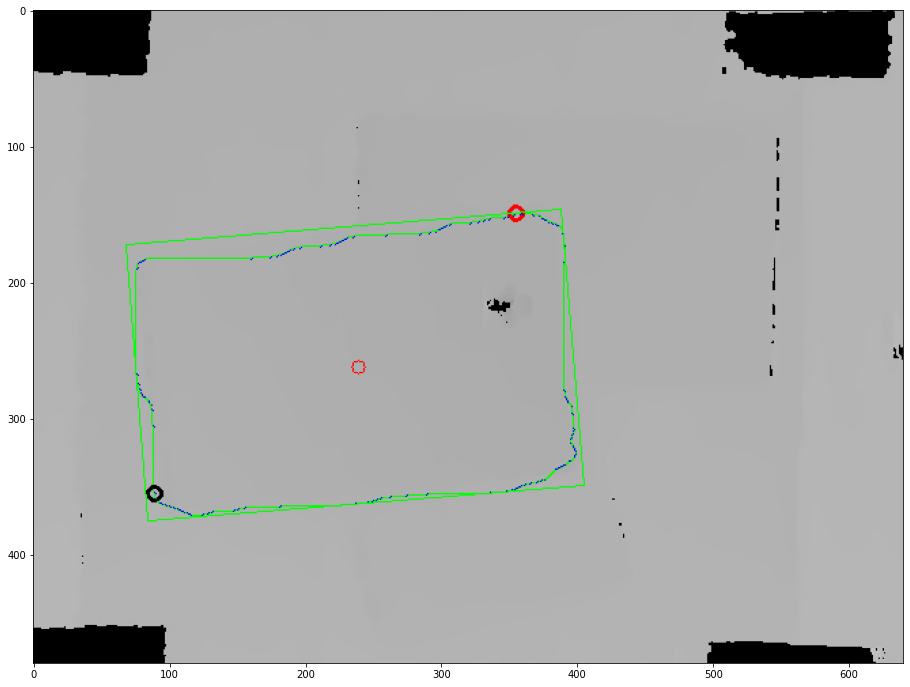

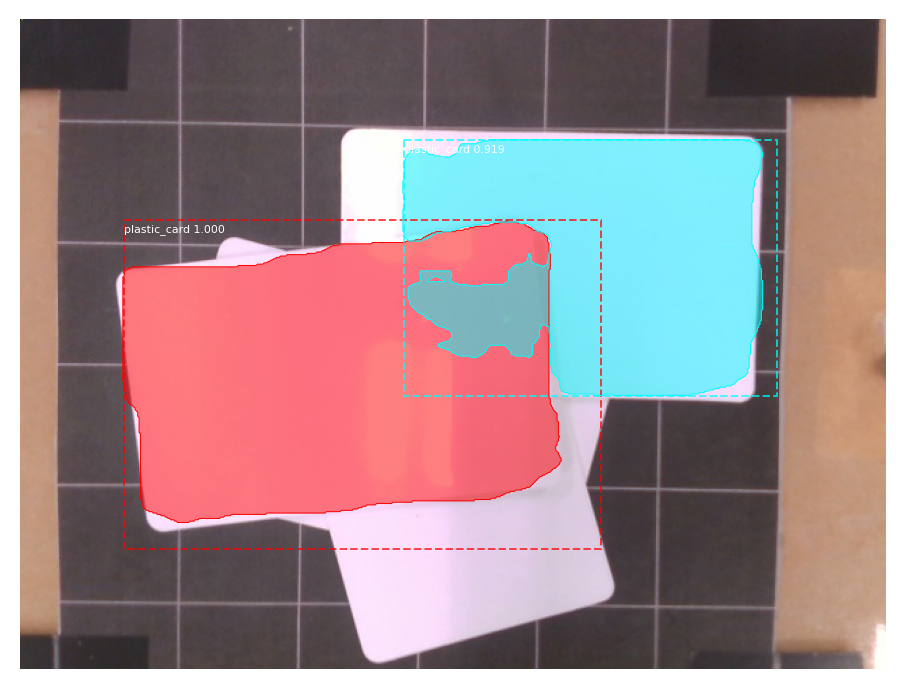

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 1
x: -0.023562087564837415
y: 0.006773822517084849
z: 0.174
yaw: -2.229753992933955
pitch: 0.2551823906208186
normal: [-0.04738251  0.03952902 -0.92055707]
box: "[[-0.06723531312515293, 0.038688882226767106], [-0.07175749530390547, -0.018715187808649676],\
  \ [0.018686148271145193, -0.026067433231905024], [0.023490966836069757, 0.03133663680351175]]"
Processing 1 images
image                    shape: (480, 640, 3)         min:   34.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


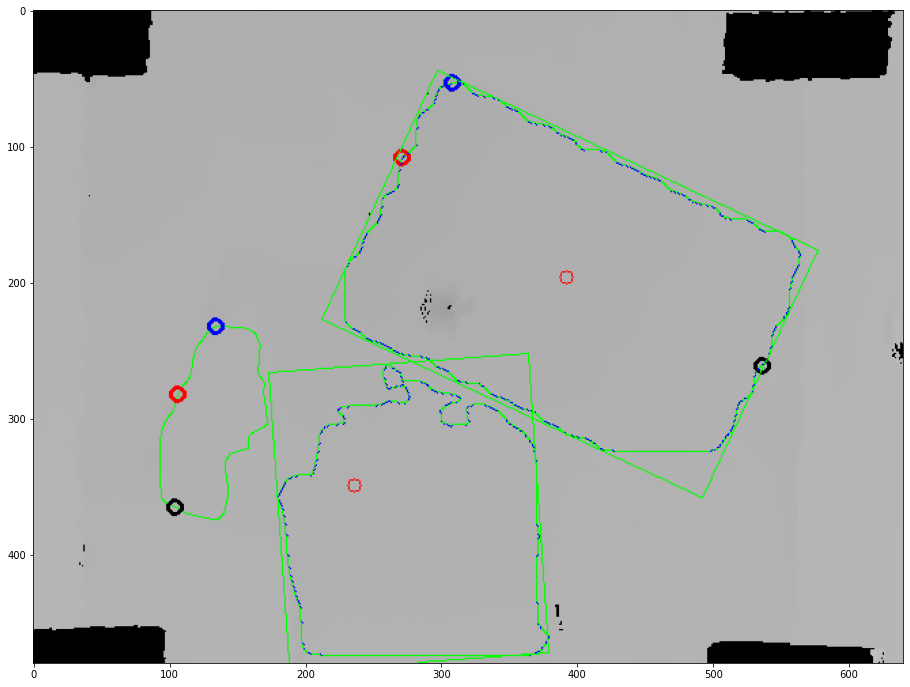

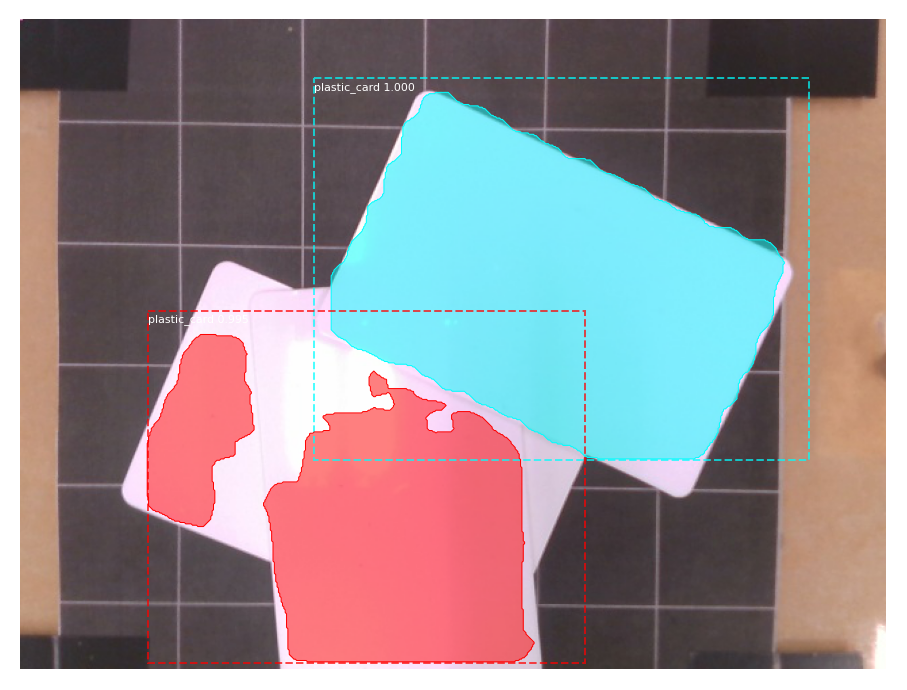

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 2
x: 0.020045788542027924
y: -0.012066401456577044
z: 0.175
yaw: 2.0944012684035536
pitch: 0.446105548943403
normal: [ 0.03551028  0.02068993 -0.89796307]
box: "[[0.048636174426482166, 0.03427334015064598], [-0.0314169060499897, -0.0031989200379109097],\
  \ [-0.0071150780482035995, -0.055545665186811005], [0.07293800242826827, -0.017787357210555195]]"
hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 2
x: -0.024695528943079085
y: 0.031880046690277844
z: 0.176
yaw: -3.117500930164872
pitch: 0.1721908145229392
normal: [ 0.00929954  0.06338191 -0.95552153]
box: "[[-0.038497333511757326, 0.07129252815882674], [-0.04281039743946928, 0.008002411931959892],\
  \ [0.012109283240062914, 0.003974859081159275], [0.016422347167774867, 0.06726497530802612]]"
Processing 1 images
image                    shape: (480, 6

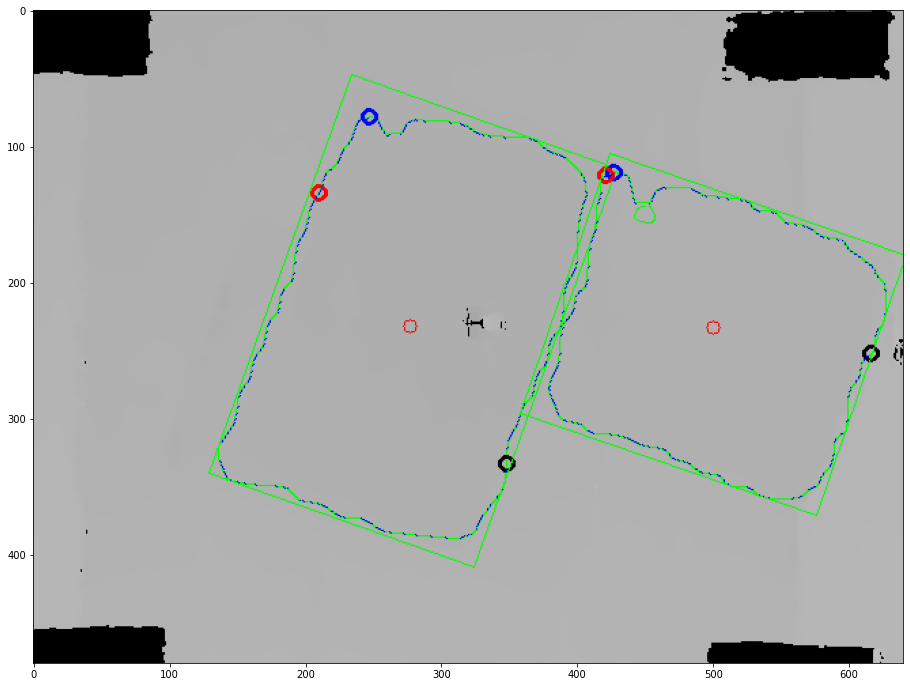

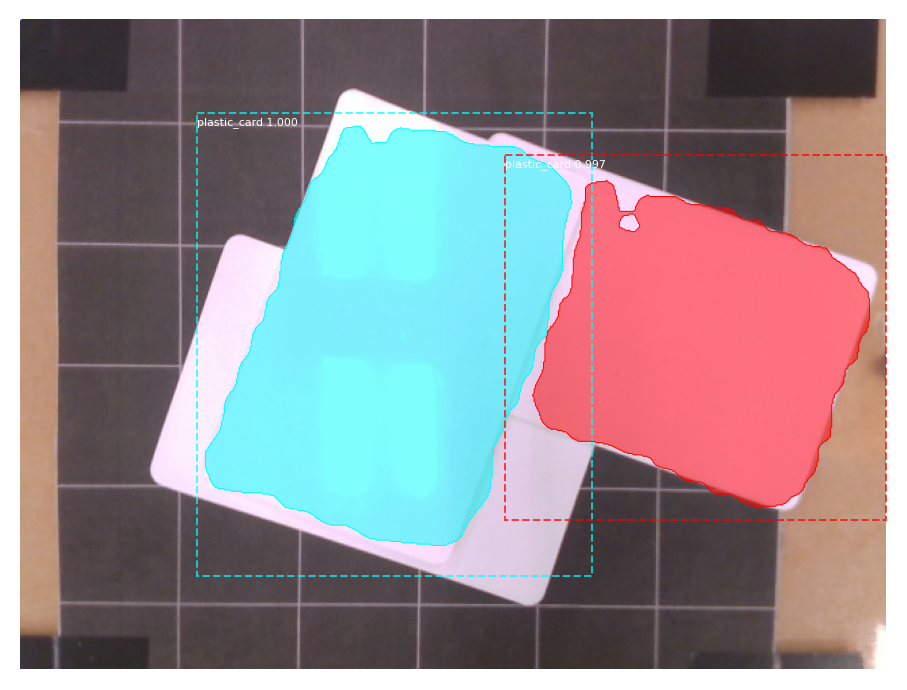

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 2
x: -0.012759822909522477
y: -0.0017585743502768494
z: 0.174
yaw: 2.5352644957601855
pitch: 0.1721908145229392
normal: [-0.01466798  0.015722   -0.92165475]
box: "[[0.0006008728483670512, 0.04858256716715717], [-0.05483180104074906, 0.02895805437222527],\
  \ [-0.024983438177378848, -0.05437502169900733], [0.030449235711737268, -0.03475050890407541]]"
hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 2
x: 0.05121439618465129
y: -0.0014911055020701352
z: 0.176
yaw: 2.162340828164128
pitch: 0.29544083714372027
normal: [-3.41406688e-04  2.45959629e-03 -9.52334074e-01]
box: "[[0.07306725341839183, 0.038209058312964526], [0.010384057668978132, 0.016632882326532646],\
  \ [0.029361538950910725, -0.03831444585224721], [0.09204473470032444, -0.01673826986581533]]"
Processing 1 images
image                    sha

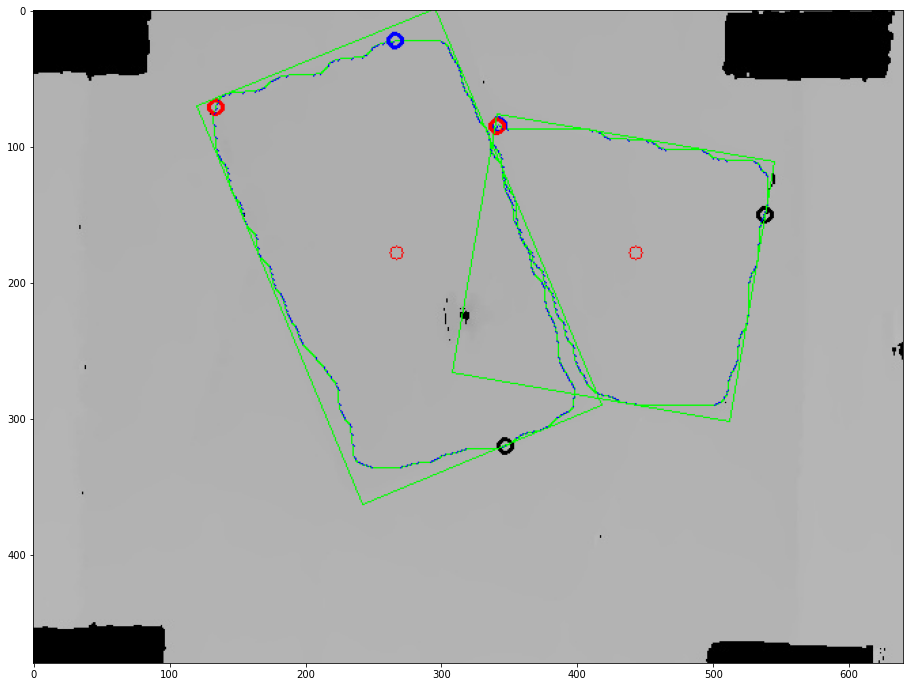

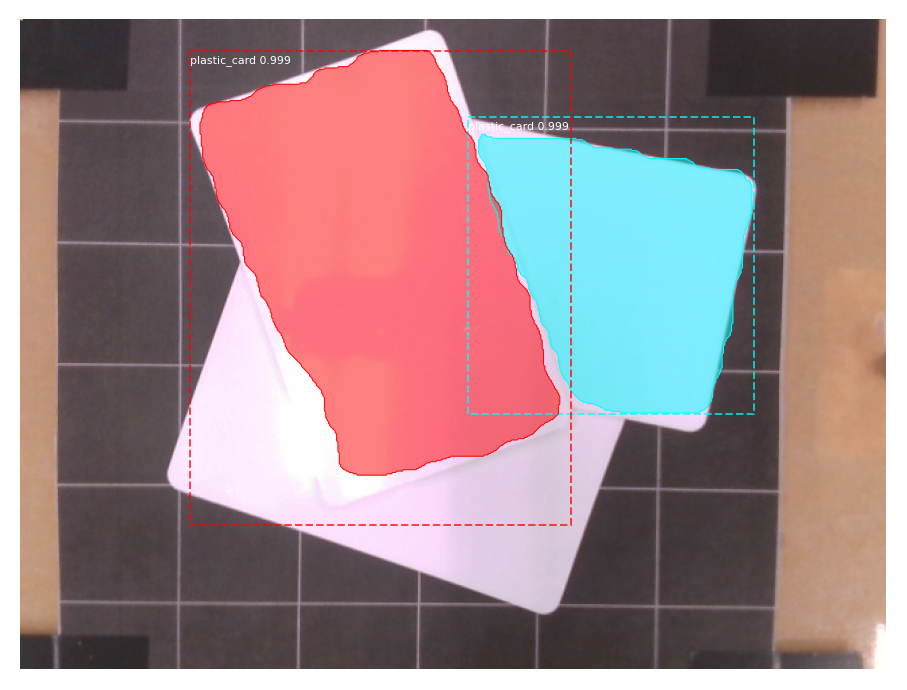

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 2
x: -0.015602524134605354
y: -0.01711688871152791
z: 0.174
yaw: 2.433959429795077
pitch: 0.2551823906208175
normal: [ 0.01631625  0.02048225 -0.89613195]
box: "[[-0.022709277197312548, 0.03549955863720257], [-0.05739023214332366, -0.04783351743403002],\
  \ [-0.007358690581865007, -0.0683112699156981], [0.027322264364146105, 0.014737392926622435]]"
hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 2
x: 0.034824753259345864
y: -0.017313634558786848
z: 0.176
yaw: 1.889498110149883
pitch: 0.29544083714372027
normal: [ 0.02054218  0.01118529 -0.96026409]
box: "[[0.05435425160337302, 0.018254664039507162], [-0.003970135600913633, 0.007956943682346486],\
  \ [0.005464691740956267, -0.04639213598044596], [0.06378907894524291, -0.036380463410984186]]"
Processing 1 images
image                    shape: (480, 640

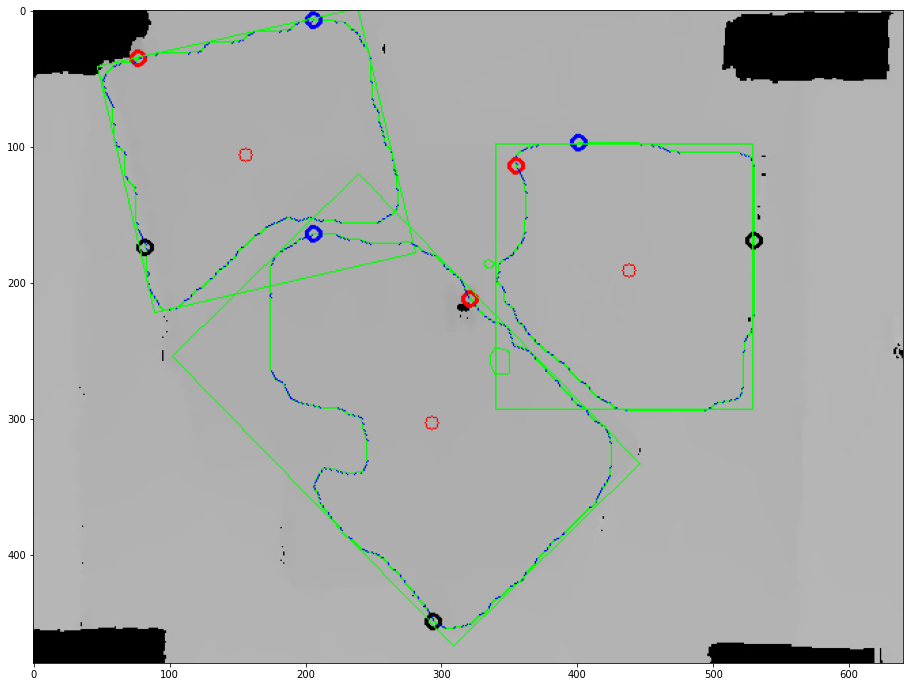

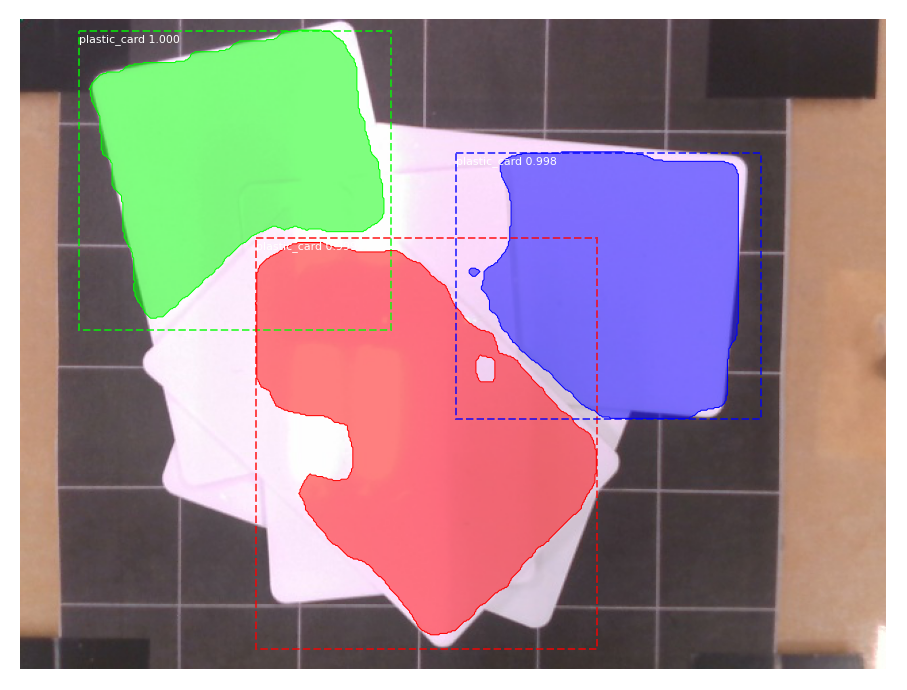

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 3
x: -0.008164308415197975
y: 0.01832881797775228
z: 0.173
yaw: -3.0281576617825765
pitch: 0.60780199611396
normal: [-0.00185703  0.03947736 -0.95825113]
box: "[[-0.0036421262364454434, 0.06470451987828603], [-0.062147858174056346, 0.0044726631416172],\
  \ [-0.023426673268487776, -0.03341967865516038], [0.03507905866912312, 0.02681217808150846]]"
hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 3
x: 0.03338706528344188
y: -0.01357376405447199
z: 0.176
yaw: 1.875307209997009
pitch: 0.1721908145229392
normal: [ 0.01573303  0.01658294 -0.95191583]
box: "[[0.00518180758350071, 0.015689376943773967], [0.00518180758350071, -0.04012246604153708],\
  \ [0.05924914467731841, -0.04012246604153708], [0.05924914467731841, 0.015689376943773967]]"
hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    ns

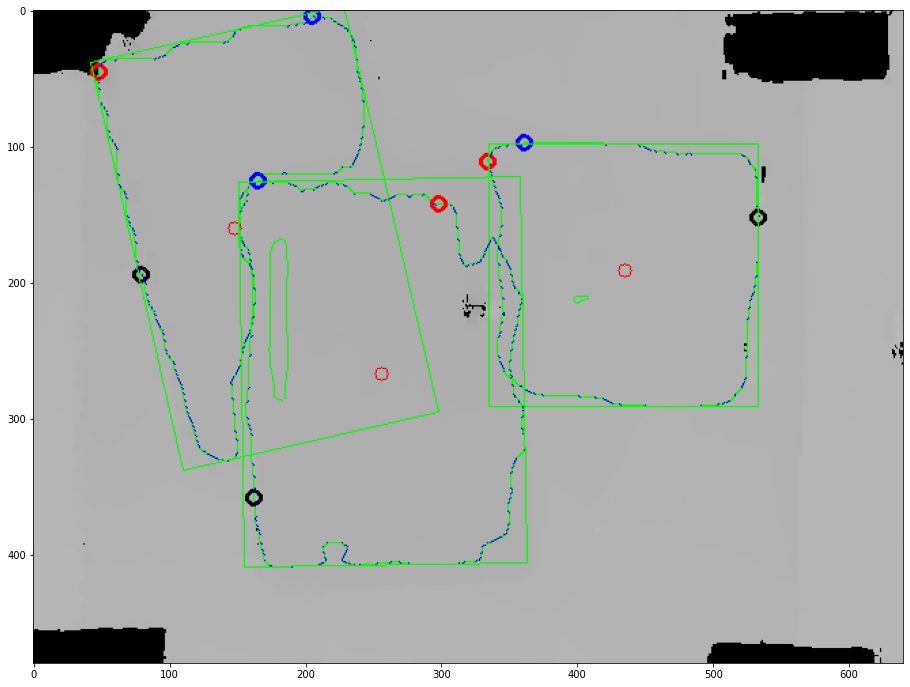

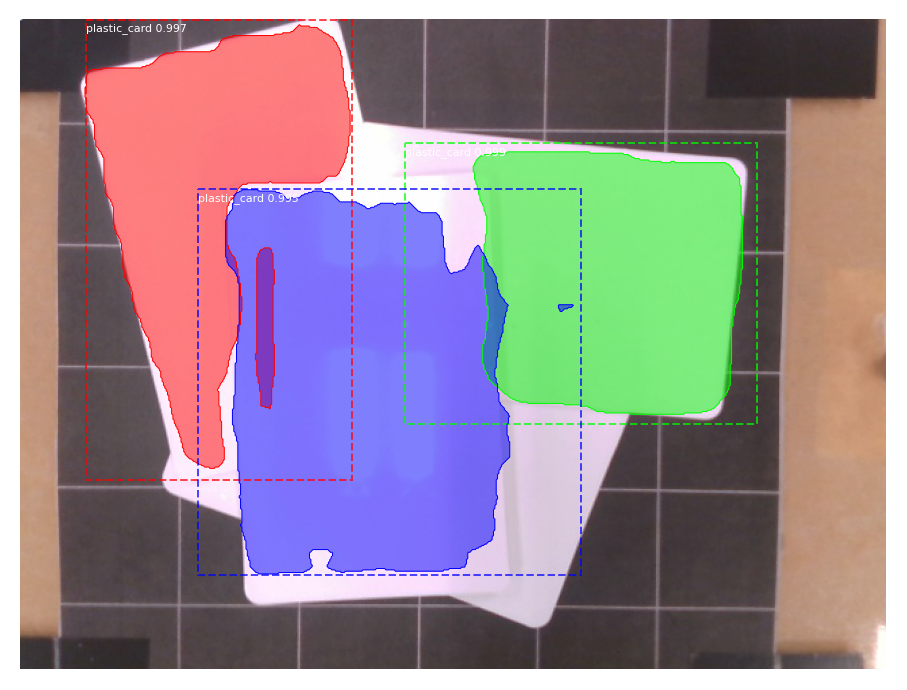

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 3
x: -0.01872949548219652
y: 0.008195888661645133
z: 0.174
yaw: -2.579671091332978
pitch: 0.2551823906208186
normal: [-0.02817846  0.03918049 -0.92567892]
box: "[[-0.04730167165727082, 0.04844011300586478], [-0.0484354179915157, -0.031812820502431526],\
  \ [0.010235954805656668, -0.032947137583820875], [0.011653137723462765, 0.04758937519482277]]"
hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 3
x: 0.032524452497899495
y: -0.01357376405447199
z: 0.176
yaw: 1.7739833276855799
pitch: 0.29544083714372027
normal: [ 0.02115889  0.0068774  -0.96629701]
box: "[[0.06070313682561758, 0.015194470594103851], [0.0037706929798198056, 0.015194470594103851],\
  \ [0.0037706929798198056, -0.04032822227764752], [0.06070313682561758, -0.04032822227764752]]"
hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 

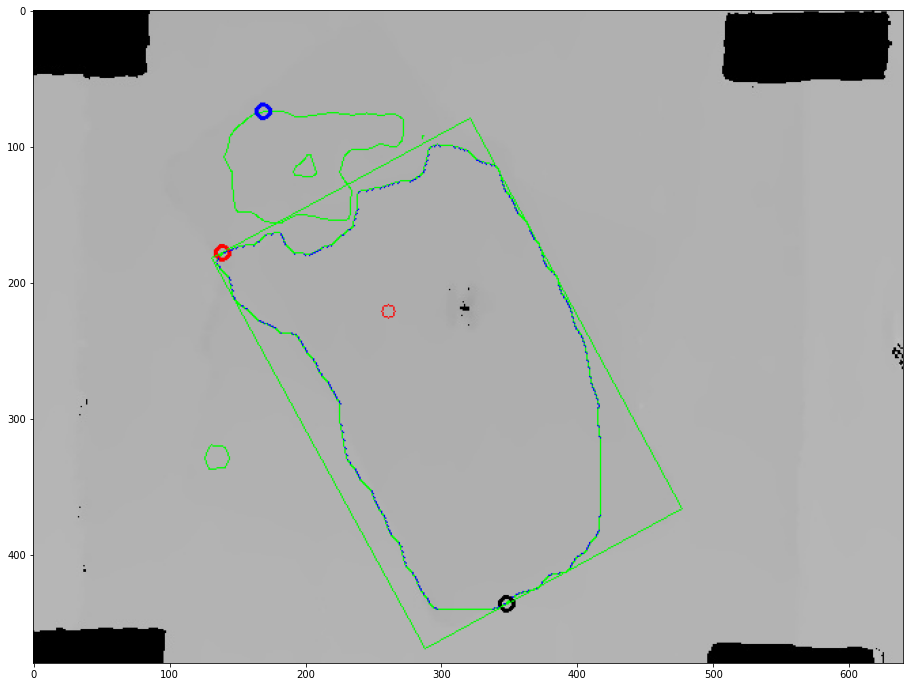

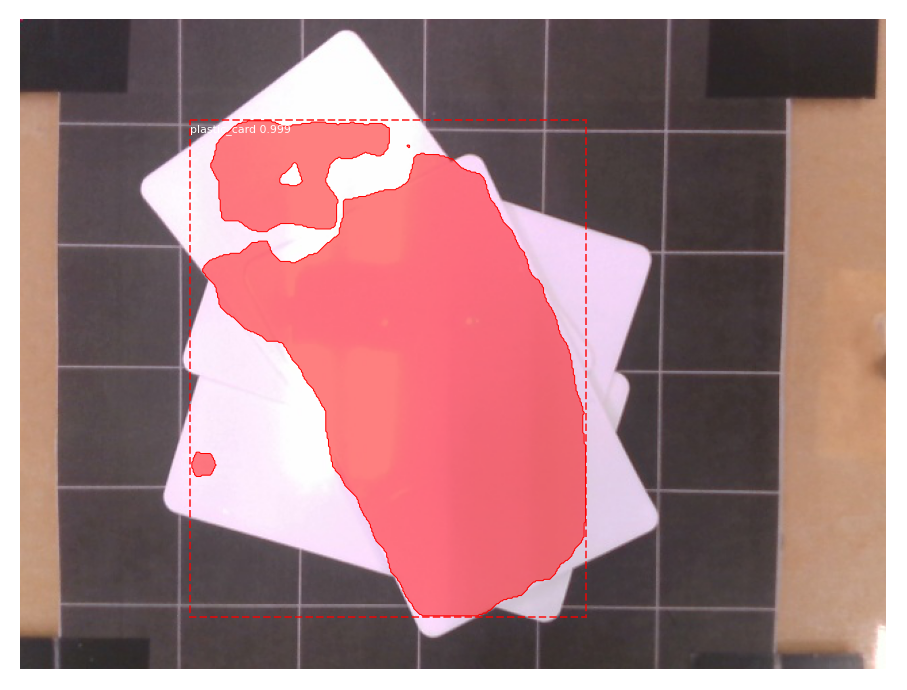

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 1
x: -0.01730814486965508
y: -0.004887119868309473
z: 0.174
yaw: 2.4607370180555437
pitch: 0.29544083714372027
normal: [ 0.01122018  0.03027622 -0.90974536]
box: "[[-0.009632851561931308, 0.06564736090188056], [-0.05426326079573249, -0.01597923579587968],\
  \ [-0.00025193751915781205, -0.045273798373821506], [0.04409420159213508, 0.036352798323938736]]"
Processing 1 images
image                    shape: (480, 640, 3)         min:    8.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


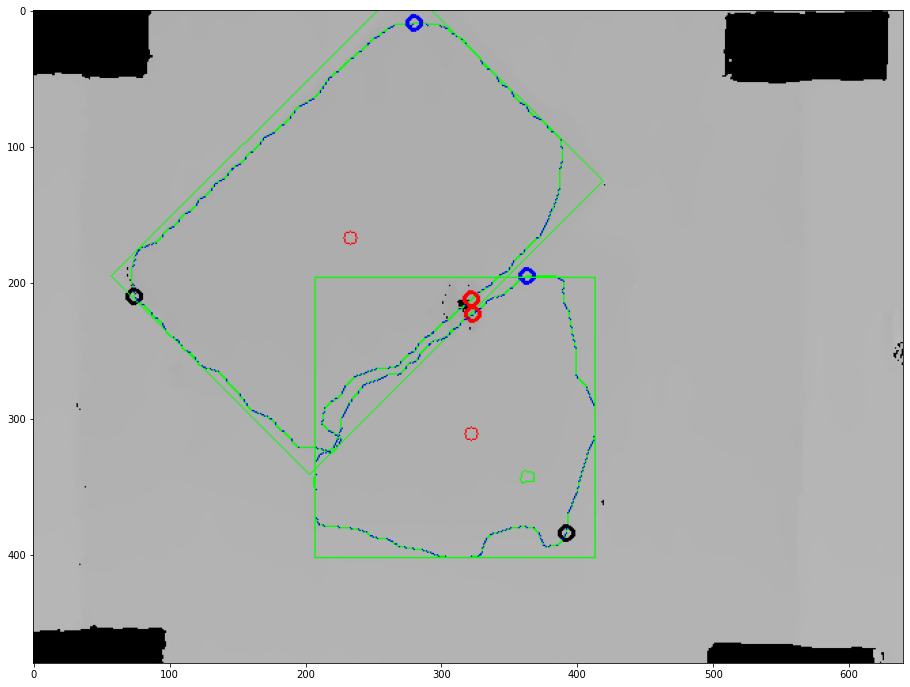

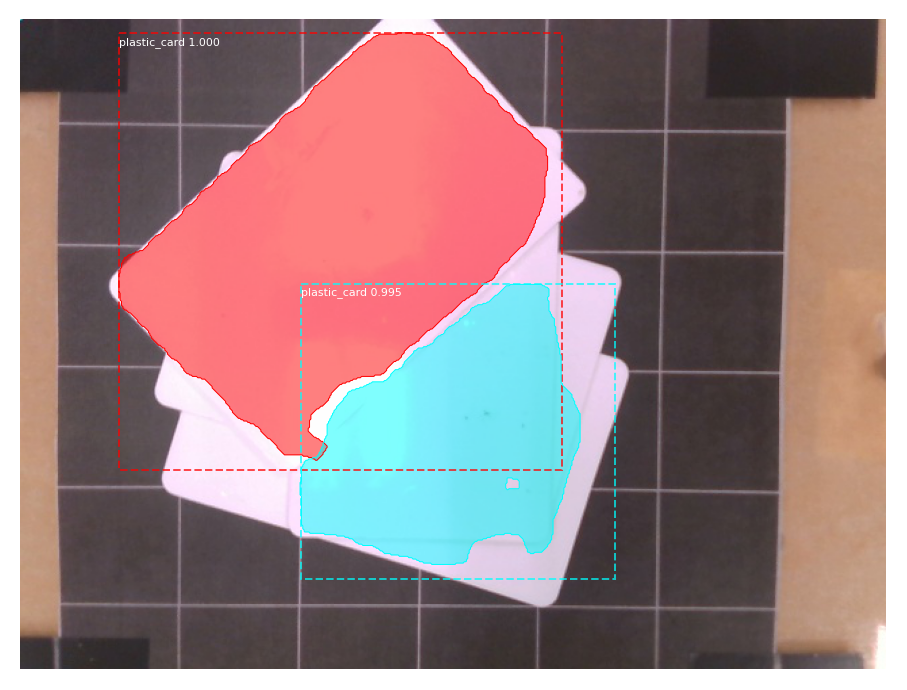

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 2
x: -0.025122491585519973
y: -0.0201290811592757
z: 0.173
yaw: -1.5627319854881296
pitch: 0.446105548943403
normal: [-0.00155764  0.01038489 -0.95369854]
box: "[[-0.033601583170680974, 0.029074407442510105], [-0.07486649555179783, -0.012211278395769942],\
  \ [-0.013817036138638642, -0.0730086924726892], [0.027447876242478225, -0.032005785304534344]]"
hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 2
x: 3.251842290996122e-05
y: 0.020829094128797326
z: 0.175
yaw: 2.7367008673047097
pitch: 0.5144513130590272
normal: [ 0.01489798  0.04440218 -0.94236384]
box: "[[0.02604976957776332, 0.04685944280939792], [-0.032846425344212414, 0.04685944280939792],\
  \ [-0.032846425344212414, -0.012066401456577044], [0.02604976957776332, -0.012066401456577044]]"
Processing 1 images
image                    shape: (480, 

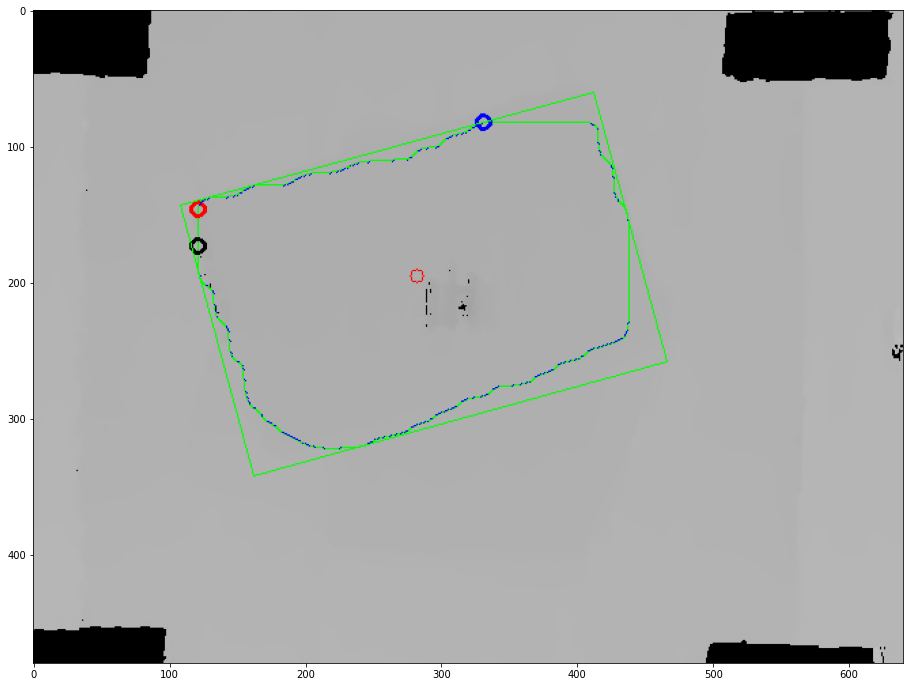

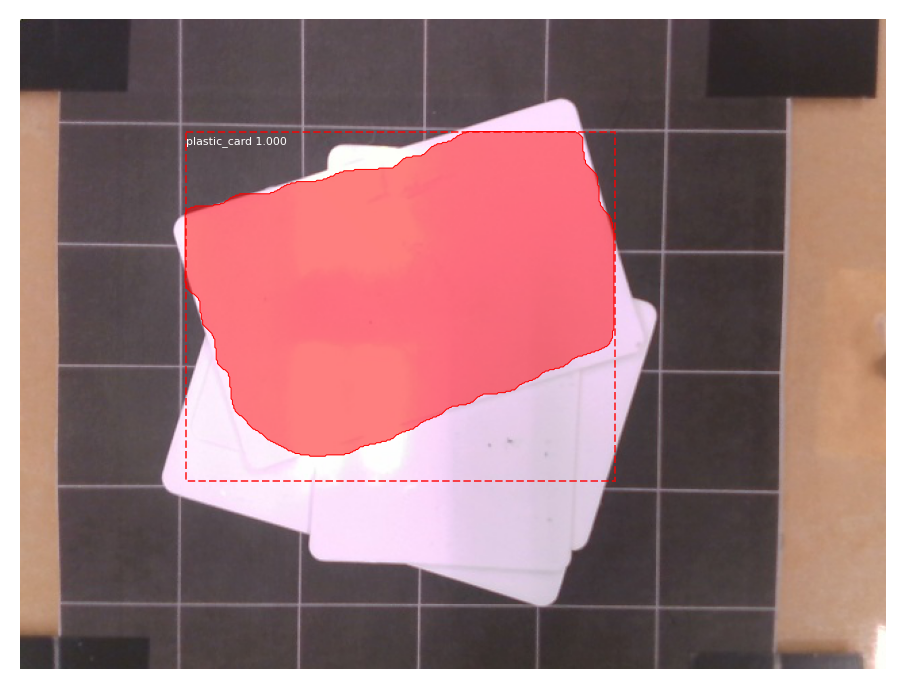

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 1
x: -0.011273308663090342
y: -0.01221127839576994
z: 0.173
yaw: 1.5707963267948966
pitch: 0.1721908145229392
normal: [ 0.01706638  0.02637968 -0.90442952]
box: "[[-0.0453869167136716, 0.029485322940070422], [-0.06071589799961113, -0.027033249891326806],\
  \ [0.025580589239752118, -0.050606322981809074], [0.04090957052569164, 0.0056282369207871705]]"
Processing 1 images
image                    shape: (480, 640, 3)         min:   36.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


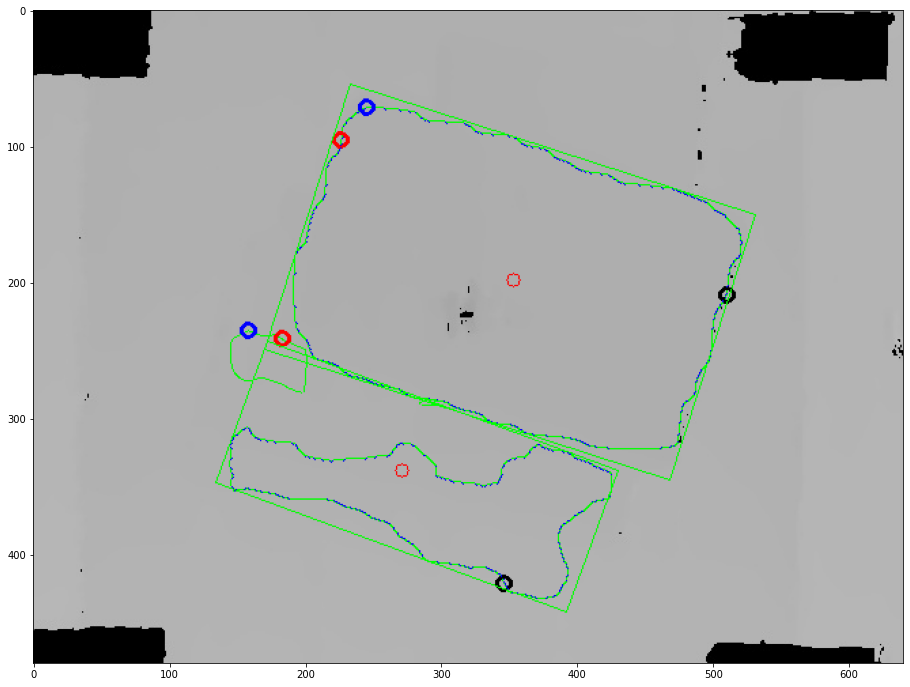

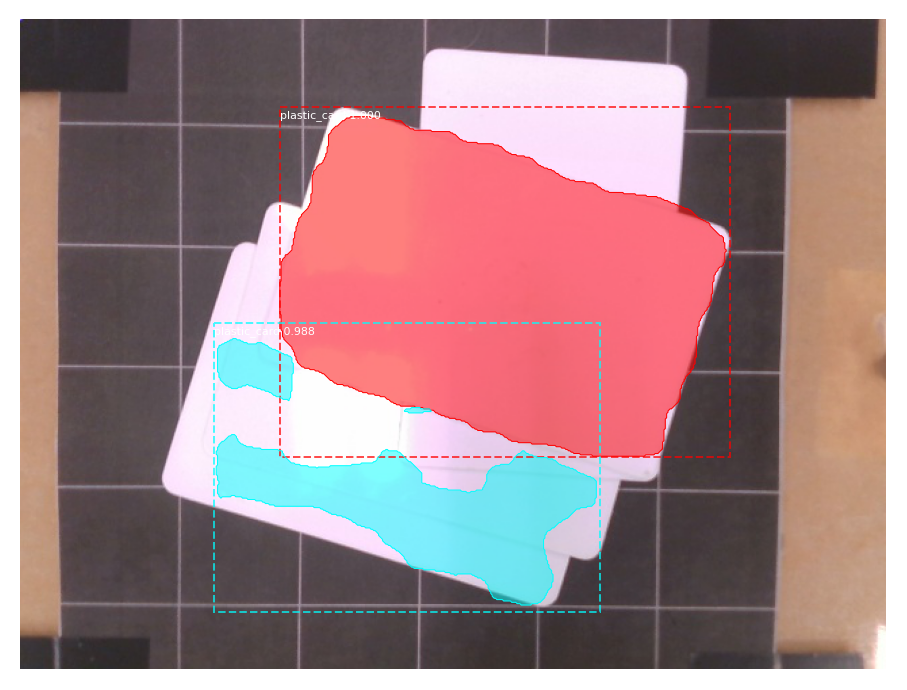

hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 2
x: 0.008844706401107398
y: -0.011428624133286776
z: 0.174
yaw: 1.9525162955444764
pitch: 0.21406068356382169
normal: [ 0.00443134  0.01546758 -0.90189446]
box: "[[0.04153577048956049, 0.030380120516785545], [-0.04317672601790926, 0.003076450541228113],\
  \ [-0.025267708299887136, -0.05238412909662292], [0.059444788207582616, -0.02508045912106549]]"
hori_stone_pose_msg is  header: 
  seq: 0
  stamp: 
    secs: 0
    nsecs:         0
  frame_id: ''
Go_stone_number: 2
x: -0.014631713111751194
y: 0.028715540878934503
z: 0.176
yaw: 2.4057166492108273
pitch: 0.21406068356382169
normal: [-0.02643314  0.22792808 -0.95525268]
box: "[[0.02027488326822253, 0.05896765550955255], [-0.05433132026317673, 0.03148254950865466],\
  \ [-0.043342809665528774, 0.0013935913603032872], [0.03126339386587049, 0.028878697361201175]]"


In [ ]:
while (True):
    if(is_detect == 1):
        if os.path.exists('mask')==False:
            os.makedirs('mask')
        else:
            shutil.rmtree('mask')
            os.mkdir('mask')
        hori_pose_pub = rospy.Publisher('/plastic_card_pose', plastic_card_pose, queue_size=10)
        #img_index = 66
        img_index = str(img_index)
        
        # instance segmentation
        image = skimage.io.imread("JPEGImages/"+img_index+".jpeg")
        
        # Run detection
        results = model.detect([image], verbose=1)
        # Visualize results
        r = results[0]
        
        #depth_image = cv2.imread("depth/"+img_index+".jpeg")
        depth_image = cv2.imread("depth/"+img_index+".jpeg")
        depth_array = np.load("./depth/"+img_index+".npy")
        hori_pose = generate_stone_pose(depth_image, depth_array, r)
        #plt.figure()
        #plt.rcParams['figure.figsize'] = [24, 12]
        #plt.imshow(depth_copy)
        visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])
        if hori_pose == []:
            hori_stone_pose_msg = plastic_card_pose()
            hori_stone_pose_msg.Go_stone_number = 0
            hori_pose_pub.publish(hori_stone_pose_msg)
            print('hori_stone_pose_msg is ', hori_stone_pose_msg)
        else:
            for i in range(len(hori_pose)):
                hori_stone_pose_msg = plastic_card_pose()
                hori_stone_pose_msg.Go_stone_number = len(hori_pose)
                hori_stone_pose_msg.x = hori_pose[i][0]['x']
                hori_stone_pose_msg.y = hori_pose[i][0]['y']
                hori_stone_pose_msg.z = hori_pose[i][0]['z']   
                hori_stone_pose_msg.yaw = hori_pose[i][0]['yaw']
                hori_stone_pose_msg.pitch = hori_pose[i][0]['pitch']
                hori_stone_pose_msg.normal = hori_pose[i][0]['normal']
                hori_stone_pose_msg.box = str(hori_pose[i][2])
                np.save('mask/hori_'+str(i)+'.npy', hori_pose[i][3])  
                print('hori_stone_pose_msg is ', hori_stone_pose_msg)
                hori_pose_pub.publish(hori_stone_pose_msg)
        is_detect = 0


In [ ]:
#print(depth_array[479,639]/1000)

In [33]:
#print(np.load('mask/hori_0.npy').shape)

(480, 640)
